In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
import gzip
import csv
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import xml.etree.ElementTree as ET
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from Bio import SeqIO
import scipy.sparse as sp
import ast
import os
import warnings
warnings.filterwarnings('ignore')

# I. hiPSC data
## Nakajima et al. (2021)
Grafting of iPS cell-derived tenocytes promotes motor function recovery after Achilles tendon rupture
GSM4743488:  
    - 3' single-cell RNA-seq 10X Genomics Chromium    
	- Cell ranger v3.1.0  
	- Female (African/American), peripheral blood derived  

adata

* <span style="color: green;"><strong>Loading the data</strong></span>  
The dataset is generated using 3' single-cell RNA sequencing (scRNA-seq) technology with the 10X Genomics Chromium platform. The data processing and analysis were performed using the Cell Ranger software version 3.1.0.

In [ ]:
config = pd.read_csv('config.csv', index_col='index')    # read the config.csv with your path variables
nak_path = config.loc['nakajima_folder', 'path']         # folder with the `.mtx` file for Nakajima et al.
bau_path = config.loc['bautista_folder', 'path']         # folder with the `.mtx` file for Bautista et al.
results = config.loc['results', 'path']                  # folder where the results will be stored

In [ ]:
# Resolution and background color of the figures setup
sc.settings.set_figure_params(dpi=80, facecolor='white')  

# Verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 2  

In [ ]:
# Creating an AnnData object
adata = sc.read_10x_mtx(
    nak_path,                     # the directory with the `.mtx` file
    var_names='gene_symbols',     # use gene symbols for the variable names
    cache=True                    # write a cache file for faster subsequent reading
)

... reading from cache file cache\ipsc_comp-a_ipsc-data-matrix.h5ad


* <span style="color: green;"><strong>Data exploration</strong></span> 

In [ ]:
# Data exploration
print(adata)
print("Number of iPSC:", adata.n_obs)
print("Number of genes:", adata.n_vars)

AnnData object with n_obs × n_vars = 6794880 × 33538
    var: 'gene_ids', 'feature_types'
Number of iPSC: 6794880
Number of genes: 33538


In [ ]:
# Column names of the observation (cell) metadata stored in the AnnData object -> in this case we don't have as we have only one sample
adata.obs.columns

Index([], dtype='object')

normalizing counts per cell
    finished (0:00:00)


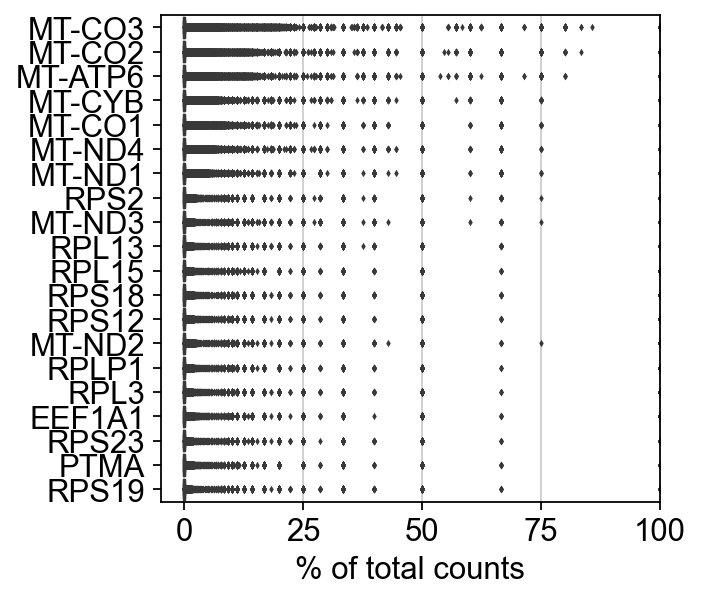

In [ ]:
# Plot the highest expressing genes
warnings.filterwarnings("ignore", category=UserWarning, module="scanpy.preprocessing._normalization")
fig1, ax1 = plt.subplots()
plt.xlim([-5, 100])
sc.pl.highest_expr_genes(adata, n_top=20, ax=ax1)

* <span style="color: green;"><strong>Filtering and Normalization</strong></span>    

In the context of scRNA-seq data analysis, filtering and normalization are crucial steps to ensure the accuracy and reliability of the downstream analyses. Filtering aims to remove low-quality cells or low-quality genes/features from the dataset. Low-quality cells may include cells with low RNA content, high levels of ambient RNA contamination, or technical artifacts. Additionally, filtering out low-quality genes/features, such as those with low expression or genes that are not informative, reduces the noise and focuses the analysis on the biologically relevant signals. On the other hand, normalization aims to remove the technical biases and variations across cells, making the expression levels comparable between cells. scRNA-seq data often suffers from technical variations, such as differences in sequencing depth and library sizes. Normalization methods adjust for these variations to enable meaningful comparisons between cells and to ensures that differences observed in gene expression levels between cells reflect biological variations rather than technical artifacts. It allows for accurate identification of Differentially Expressed Genes (DEG), clustering of cells, and other downstream analyses.

By performing filtering and normalization, we improve the quality and reliability of the dataset, minimize the technical biases, and ensure that subsequent analyses are based on meaningful biological signals. These steps are essential for accurate interpretation and understanding of the underlying biology and enable comparisons between cells.  

<span style="color: green;"><strong>Filtering low-quality cells</strong></span>  
Low-quality cells refer to cells that may have been damaged during the experimental process or did not yield reliable data. These cells could introduce noise or bias into the analysis and potentially affect the interpretation of the results. Filtering out such cells helps to ensure that the subsequent analyses are based on high-quality data.

Genes with low expression levels are those that are minimally expressed or have very low abundance in the analyzed cells. Including these genes in the analysis can lead to increased noise and make it challenging to distinguish genuine gene expression patterns from background noise. By filtering out low expression genes, the focus can be directed towards more informative genes, improving the sensitivity and specificity of the analysis.

Downstream analyses in scRNA-seq involve clustering of the cells, identifying DEG, and performing pathway or functional enrichment analyses. Noise refers to random variations or technical artifacts that can obscure true biological signals. Bias, on the other hand, refers to systematic distortions introduced during the experimental or analysis process that can lead to inaccurate results. Low-quality cells and genes with low expression levels can contribute to noise and bias, affecting the reliability and interpretability of downstream analyses.

In [ ]:
# Filtering low-quality cells and genes
sc.pp.filter_cells(adata, min_genes=200)  # minimum number of expressed genes
sc.pp.filter_genes(adata, min_cells=3)    # minimum number of cells in which a gene should be expressed

filtered out 6723804 cells that have less than 200 genes expressed
filtered out 12417 genes that are detected in less than 3 cells


<span style="color: green;"><strong>Filtering Mitochondrial genes</strong></span>  
In scRNA-seq experiments, the genetic material from individual cells is isolated and sequenced. However, sometimes the quality of the cells being sequenced can vary, leading to potential issues in the analysis. High proportions of mitochondrial genes in scRNA-seq data can be indicative of poor-quality cells (*Islam et al., 2014; Ilicic et al., 2016*). This means that if a significant portion of the genes detected in a particular cell's transcriptome belong to the mitochondrial genome, it suggests the loss of cytoplasmic RNA from perforated cells. When cells are damaged or perforated, their cytoplasmic contents, including RNA molecules, can leak out. However, mitochondria are larger in size compared to individual transcript molecules, so they are less likely to escape through these tears in the cell membrane (*Lun, McCarthy & Marioni, 2017*).

In [ ]:
# Annotate the group of mitochondrial genes as 'mt'
adata.var['mt'] = adata.var_names.str.startswith('MT-') 

# Calculate quality control metrics, including mitochondrial gene percentage
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
adata.var

,gene_ids,feature_types,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AL627309.1,ENSG00000238009,Gene Expression,9,False,9,0.000127,99.987337,9.0
AL627309.4,ENSG00000241599,Gene Expression,5,False,5,0.000070,99.992965,5.0
AL669831.5,ENSG00000237491,Gene Expression,333,False,333,0.005135,99.531487,365.0
LINC00115,ENSG00000225880,Gene Expression,173,False,173,0.002504,99.756599,178.0
FAM41C,ENSG00000230368,Gene Expression,228,False,228,0.003292,99.679217,234.0
...,...,...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,Gene Expression,45,False,45,0.000633,99.936687,45.0
AC007325.2,ENSG00000277196,Gene Expression,13,False,13,0.000183,99.981710,13.0
AL354822.1,ENSG00000278384,Gene Expression,40,False,40,0.000605,99.943722,43.0
AC004556.1,ENSG00000276345,Gene Expression,5,False,5,0.000070,99.992965,5.0


<span style="color: green;"><strong>Violin plots of the computed quality metrics:</strong></span>  

 - Number of genes expressed in the count matrix -> Number of genes in each cell -> the width of the violin indicates the density of cells with that particular number of genes  
 - Total counts per cell -> total count of all genes in each cell -> provides an estimate of the overall expression level or "activity" of each cell  
 - Percentage of counts in mitochondrial genes -> indicator of potential mitochondrial dysfunction or contamination    
    
By using the violin plots, it becomes easier to understand the distribution and variation of the quality measures across cells

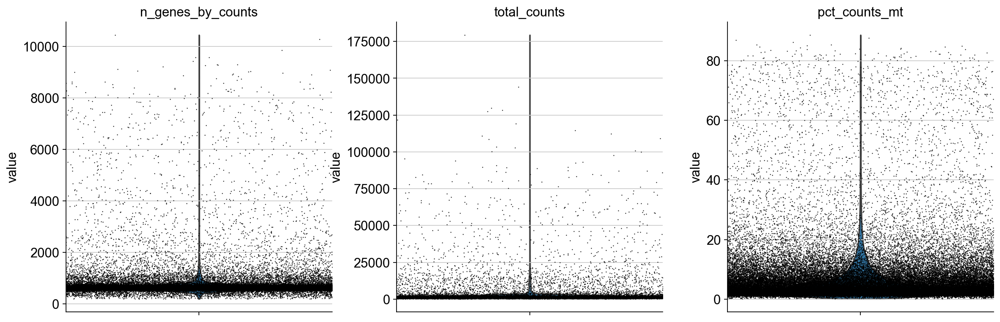

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.5,          # adds a small amount of random noise to avoid overlapping when multiple data points have the same value
             multi_panel=True)    # separate panels for each variable                                                                 

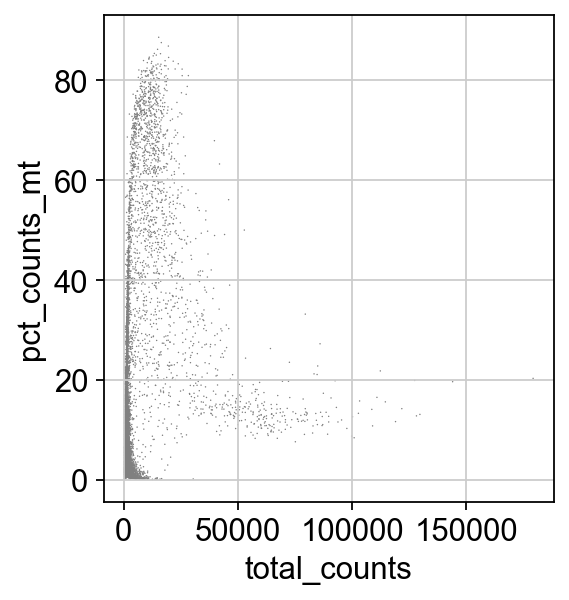

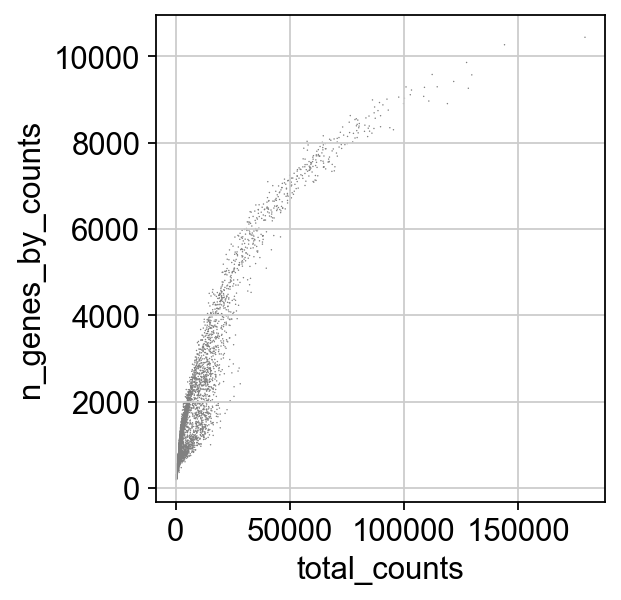

In [ ]:
# Proportion of MT genes expression
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt') 

# Overall gene expression (total counts) and the complexity of gene expression (number of genes detected) in each cell
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts') 

<span style="color: green;"><strong>Filter cells that have too many MT genes expressed or too many total counts:</strong></span>

In [ ]:
# Actually do the filtering by slicing the `AnnData` object
adata = adata[adata.obs.pct_counts_mt < 5, :]         
adata = adata[adata.obs.n_genes_by_counts < 3000, :]  

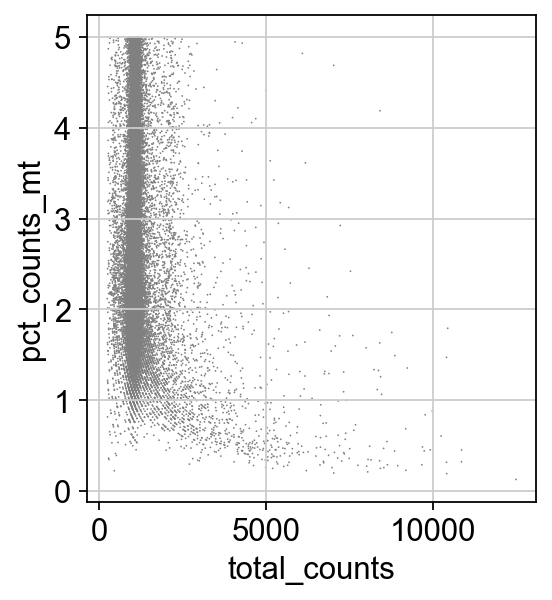

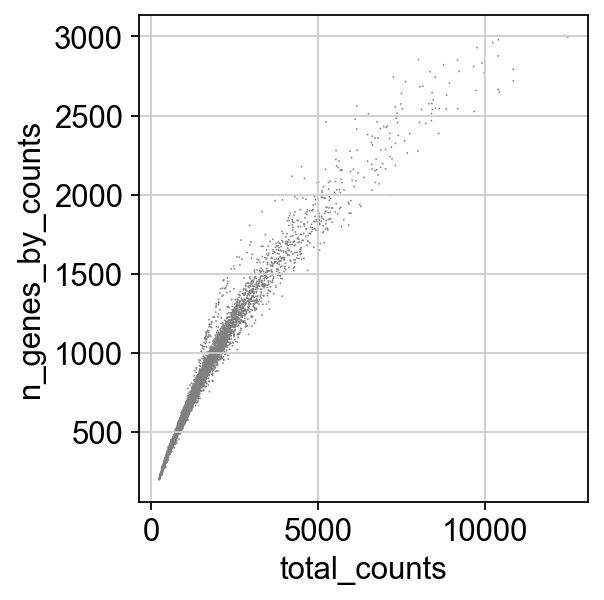

In [ ]:
# Proportion of MT genes expression after filtering
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt') 

# Overall gene expression (total counts) and the complexity of gene expression (number of genes detected) in each cell after filtering
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts') 

normalizing counts per cell
    finished (0:00:00)


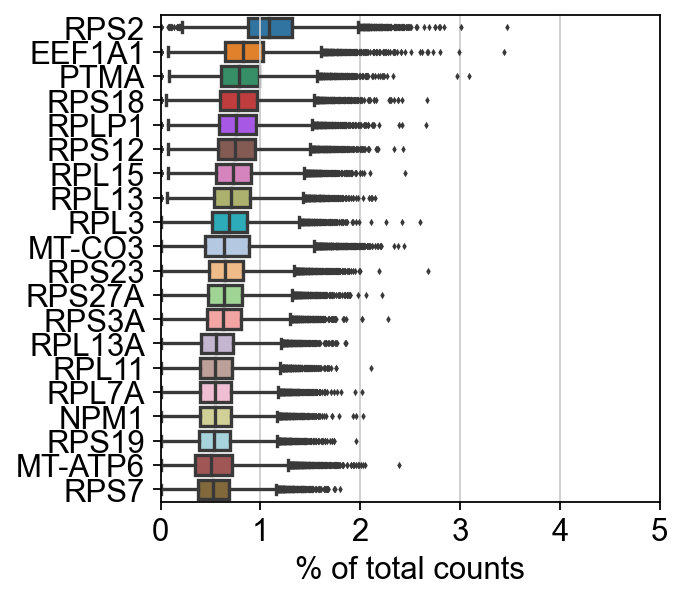

In [ ]:
# Visualizing the expression levels of the top 20 highly expressed genes after filtering
fig1, ax1 = plt.subplots()
plt.xlim([0, 5])
sc.pl.highest_expr_genes(adata, n_top=20, ax=ax1)

<span style="color: green;"><strong>TPM</strong></span>  
To ensure comparability among cells, we will perform total-count normalization or library-size correction. The purpose of this normalization is to adjust the read counts in each cell so that they are scaled to a common total count value. In this case, we will set the desired total count per cell to 1M reads. By performing TPM, any variations in the total number of reads across cells are accounted for, allowing for more accurate comparisons and analyses of the gene expression levels.

In [ ]:
# TPM Normalization
sc.pp.normalize_total(adata, target_sum=1e6)

normalizing counts per cell
    finished (0:00:00)


normalizing counts per cell
    finished (0:00:00)


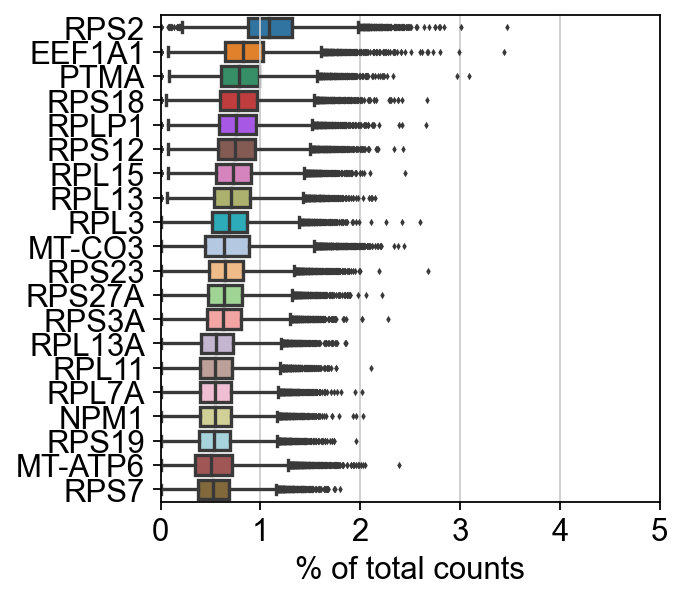

In [ ]:
# Visualizing the expression levels of the top 20 highly expressed genes after filtering and normalization
fig1, ax1 = plt.subplots()
plt.xlim([0, 5])
sc.pl.highest_expr_genes(adata, n_top=20, ax=ax1)

<span style="color: green;"><strong>Logaritmize the data</strong></span>  
Logarithmic transformation stabilizes the variance across different expression values. In scRNA-seq, the mean-variance relationship often follows a trend where the variance increases with the mean expression level. By taking the logarithm, this relationship is compressed, making it easier to apply statistical methods that assume constant variance, such as differentEal expression analysis (DEA) or clustering algorithm. Transformation can help also mitigate the impact of noise by compressing low-abundance signals that are more likely to be affected by noise, while preserving the relative differences between higher-abundance.

In [ ]:
# Natural logarithm 
sc.pp.log1p(adata) 

normalizing counts per cell
    finished (0:00:00)


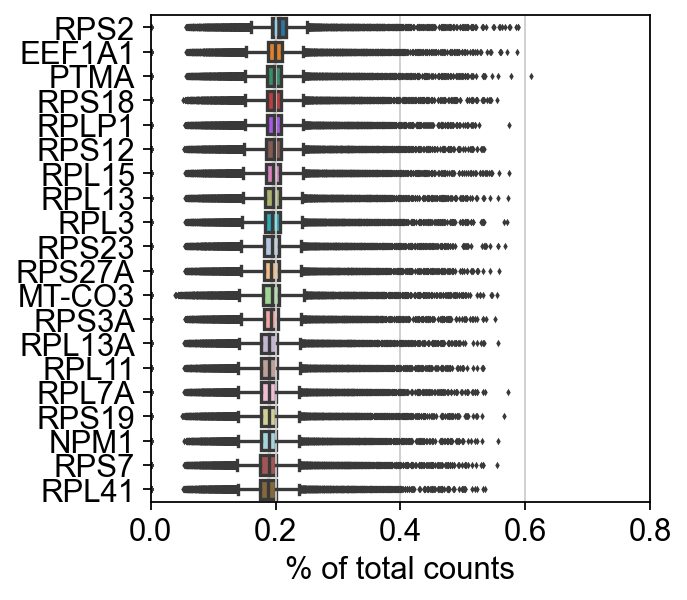

In [ ]:
# Visualizing the expression levels of the top 20 highly expressed genes after filtering, normalization and logarithmization
fig1, ax1 = plt.subplots()
plt.xlim([0, 0.8])
sc.pl.highest_expr_genes(adata, n_top=20, ax=ax1)

In [ ]:
print("Number of iPS cells:", adata.n_obs)
print("Number of genes:", adata.n_vars)

Number of iPS cells: 47530
Number of genes: 21121


In [ ]:
# Create a leiden column in the obs attribute (for afterwards merging with the primary data)
adata.obs['leiden'] = 9
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGAAAGCGA-1,658,658,1042.0,23.0,2.207294,9
AAACCCAAGAAAGTCT-1,638,638,1145.0,40.0,3.493450,9
AAACCCAAGACATACA-1,635,635,1107.0,48.0,4.336043,9
AAACCCAAGAGCATTA-1,664,664,1164.0,28.0,2.405498,9
AAACCCAAGAGTACCG-1,655,655,1088.0,24.0,2.205882,9
...,...,...,...,...,...,...
TTTGTTGTCTCCGAAA-1,604,604,1038.0,37.0,3.564547,9
TTTGTTGTCTGCTGAA-1,584,584,973.0,11.0,1.130524,9
TTTGTTGTCTGGAGAG-1,538,538,867.0,19.0,2.191465,9
TTTGTTGTCTGGTCAA-1,610,610,1002.0,18.0,1.796407,9


# II. Primary Thymus data 

## Bautista et al. (2021)
Single-cell transcriptional profiling of human thymic stroma uncovers novel cellular heterogeneity in the thymic medulla

GSE147520  
-> GSM4466780 - Fetal week 19

xdata

In [ ]:
# Reading the raw data
xdata = sc.read_10x_mtx(
    bau_path,                     
    var_names='gene_symbols',     
    cache=True                    
)

... reading from cache file cache\ipsc_comp-x_pt-data-matrix.h5ad


In [ ]:
# Data exploration
print(xdata)
print("Number of Primary Thymus cells:", xdata.n_obs)
print("Number of genes:", xdata.n_vars)

AnnData object with n_obs × n_vars = 23345 × 33694
    var: 'gene_ids'
Number of Primary Thymus cells: 23345
Number of genes: 33694


normalizing counts per cell
    finished (0:00:00)


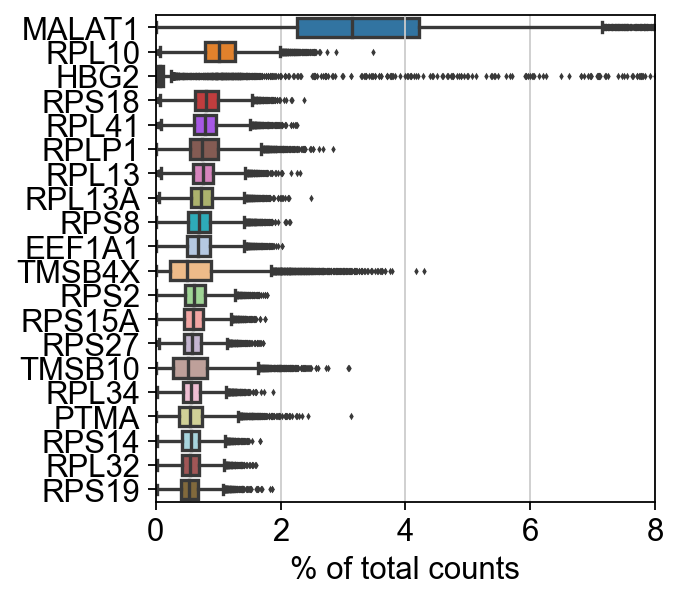

In [ ]:
# Plot the highest expressing genes
fig1, ax1 = plt.subplots()
plt.xlim([0, 8]) # x-axis limits
sc.pl.highest_expr_genes(xdata, n_top=20, ax=ax1)

* <span style="color: green;"><strong>Filtering and Normalization</strong></span>

In [ ]:
# Filtering
sc.pp.filter_cells(xdata, min_genes=200)  
sc.pp.filter_genes(xdata, min_cells=3)    

filtered out 10 cells that have less than 200 genes expressed
filtered out 11406 genes that are detected in less than 3 cells


In [ ]:
# Annotate the group of mitochondrial genes as 'mt'
xdata.var['mt'] = xdata.var_names.str.startswith('MT-') 

# Calculate quality control metrics, including mitochondrial gene percentage
sc.pp.calculate_qc_metrics(xdata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
xdata.var

,gene_ids,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
RP11-34P13.7,ENSG00000238009,22,False,22,0.000943,99.905721,22.0
FO538757.2,ENSG00000279457,739,False,739,0.032483,96.833083,758.0
AP006222.2,ENSG00000228463,1105,False,1105,0.048982,95.264624,1143.0
RP4-669L17.10,ENSG00000237094,17,False,17,0.000729,99.927148,17.0
RP5-857K21.4,ENSG00000230021,9,False,9,0.000386,99.961431,9.0
...,...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,1675,False,1675,0.083008,92.821941,1937.0
AC007325.2,ENSG00000277196,19,False,19,0.000857,99.918577,20.0
AL354822.1,ENSG00000278384,9,False,9,0.000386,99.961431,9.0
AC004556.1,ENSG00000276345,9,False,9,0.000386,99.961431,9.0


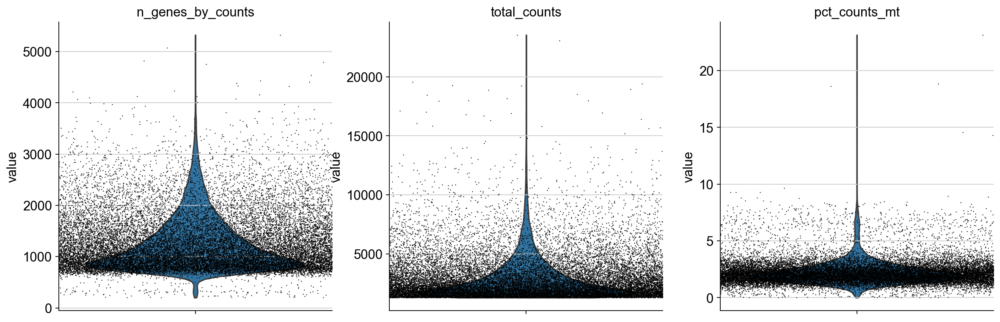

In [ ]:
sc.pl.violin(xdata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.5,          
             multi_panel=True)                                                                 

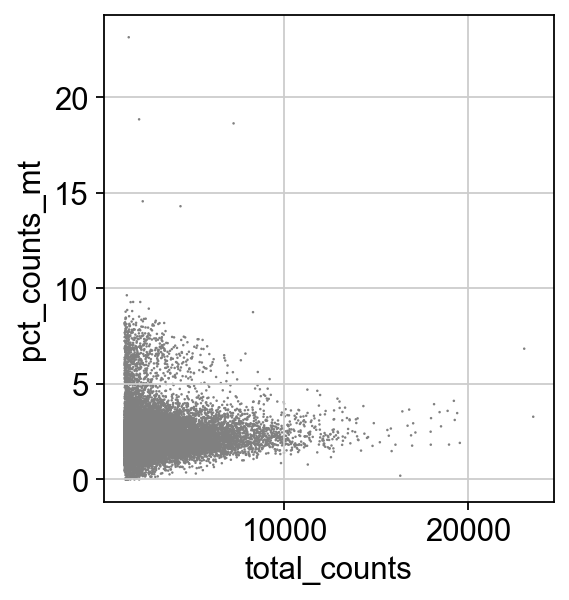

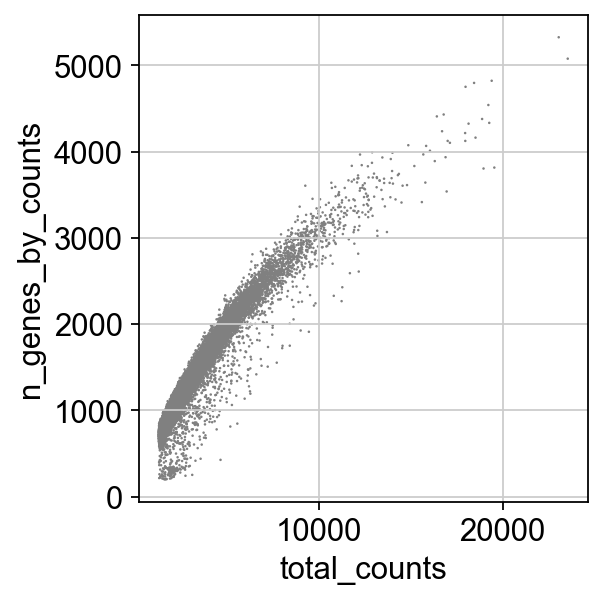

In [ ]:
# Proportion of MT genes expression
sc.pl.scatter(xdata, x='total_counts', y='pct_counts_mt') 

# Overall gene expression (total counts) and the complexity of gene expression (number of genes detected) in each cell
sc.pl.scatter(xdata, x='total_counts', y='n_genes_by_counts') 

<span style="color: green;"><strong>Filter cells that have too many MT genes expressed or too many total counts:</strong></span>

In [ ]:
# Actually do the filtering by slicing the `AnnData` object
xdata = xdata[xdata.obs.pct_counts_mt < 5, :]         
xdata = xdata[xdata.obs.n_genes_by_counts < 3000, :]  

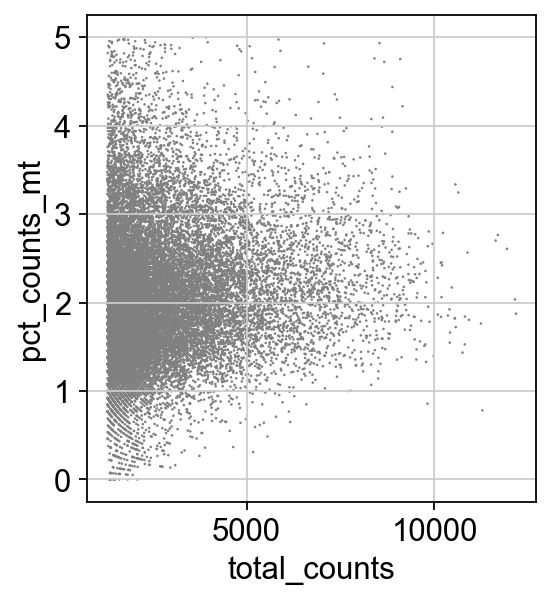

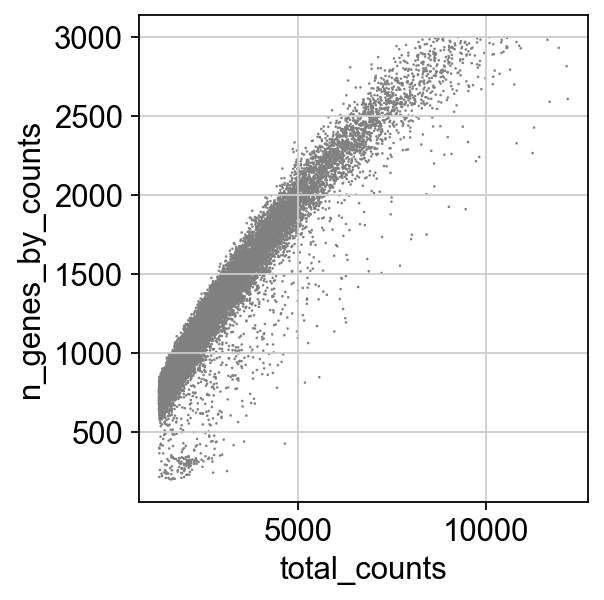

In [ ]:
# Proportion of MT genes expression after filtering
sc.pl.scatter(xdata, x='total_counts', y='pct_counts_mt') 

# Overall gene expression (total counts) and the complexity of gene expression (number of genes detected) in each cell after filtering
sc.pl.scatter(xdata, x='total_counts', y='n_genes_by_counts') 

normalizing counts per cell
    finished (0:00:00)


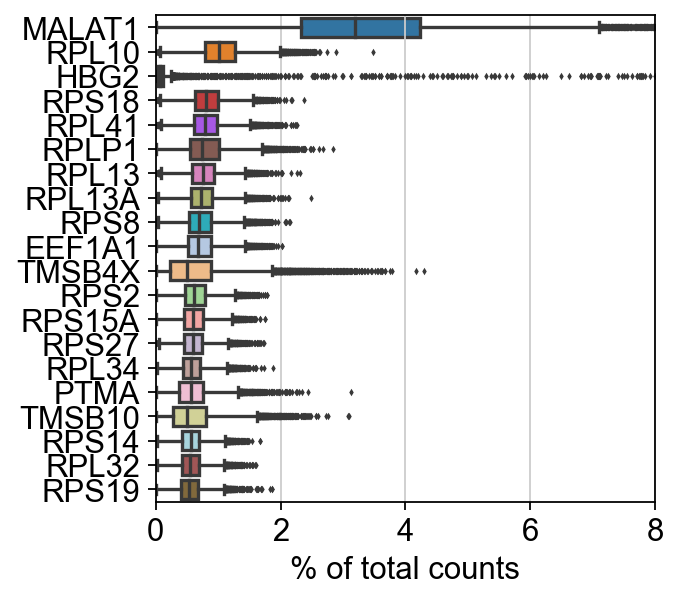

In [ ]:
# Visualizing the expression levels of the top 20 highly expressed genes after filtering
fig1, ax1 = plt.subplots()
plt.xlim([0, 8])
sc.pl.highest_expr_genes(xdata, n_top=20, ax=ax1)

<span style="color: green;"><strong>TPM</strong></span>  

In [ ]:
# TPM Normalization 
sc.pp.normalize_total(xdata, target_sum=1e6)

normalizing counts per cell
    finished (0:00:00)


normalizing counts per cell
    finished (0:00:00)


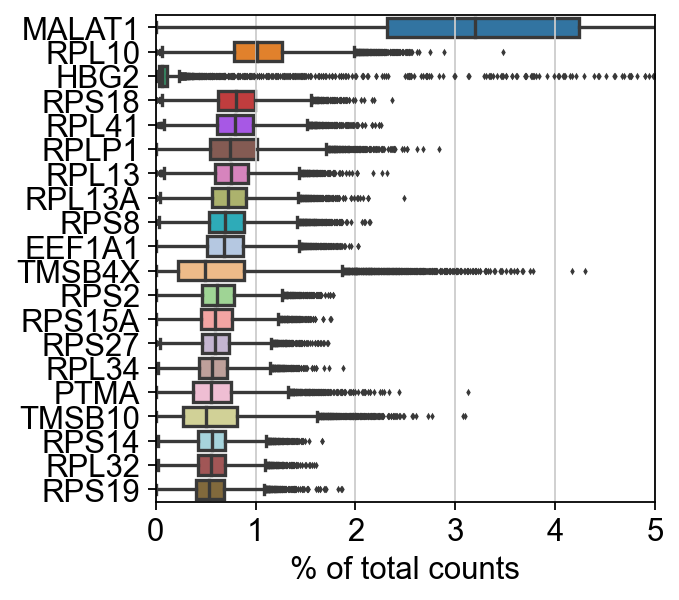

In [ ]:
# Visualizing the expression levels of the top 20 highly expressed genes after filtering and normalization
fig1, ax1 = plt.subplots()
plt.xlim([0, 5])
sc.pl.highest_expr_genes(xdata, n_top=20, ax=ax1)

<span style="color: green;"><strong>Logaritmize the data</strong></span>  

In [ ]:
# Natural logarithm 
sc.pp.log1p(xdata) 

normalizing counts per cell
    finished (0:00:00)


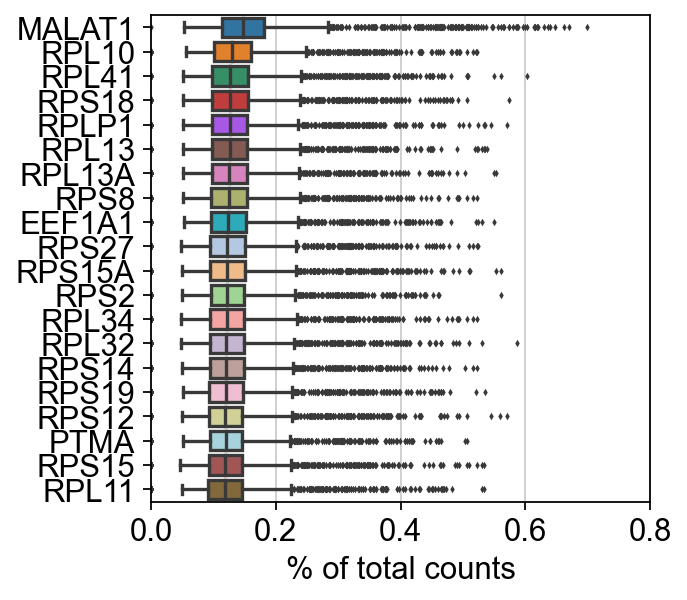

In [ ]:
# Visualizing the expression levels of the top 20 highly expressed genes after filtering, normalization and logarithmization
fig1, ax1 = plt.subplots()
plt.xlim([0, 0.8])
sc.pl.highest_expr_genes(xdata, n_top=20, ax=ax1)

In [ ]:
print("Number of thymic cells:", xdata.n_obs)
print("Number of genes:", xdata.n_vars)

Number of thymic cells: 22333
Number of genes: 22288


### Leiden Clustering  

Clustering is an unsupervised learning method that helps identify patterns, similarities, and structures within a dataset without any prior knowledge of the data labels or classes. Clustering algorithms aim to minimize the intra-cluster distance (similarity within clusters) and maximize the inter-cluster distance (difference between clusters). By clustering similar data points together, it can provide insights and facilitate further analysis.

In our analysis we aim to identify distinct subpopulation of Thymic Epithelial Cells (TEC), based on their gene expression profiles. TEC are a specialized cell population found within the thymus, located in the chest region above the heart. The thymus plays a critical role in the development and maturation of T cells, which are essential for adaptive immune responses. TEC can be broadly classified into two main subtypes: cortical thymic epithelial cells (cTEC) and medullary thymic epithelial cells (mTEC). Each subtype has distinct functions and is involved in different stages of T cell development:  
- cTEC contribute to positive selection, a crucial process where T cells with functional T cell receptors (TCRs) that recognize self-antigens presented by major histocompatibility complex (MHC) molecules are allowed to survive and mature. cTEC express MHC class I and class II molecules, which present self-antigens to developing T cells. 

- mTEC play a crucial role in negative selection, a process that eliminates T cells that strongly recognize self-antigens. Negative selection helps prevent the development of T cells that could lead to autoimmunity. mTEC express the Autoimmune Regulator (AIRE) gene, which enables them to express a wide range of tissue-specific antigens (TSA) that are not typically expressed in the thymus or other central immune organs. This exposure to TSA helps educate developing T cells to become tolerant to peripheral tissues.

The interaction between TEC and developing T cells is crucial for the proper education and selection of functional T cells. TEC provide the necessary signals and antigen presentation to guide the maturation process and ensure the development of a diverse and self-tolerant T cell repertoire. Studying TECs and their heterogeneity using techniques such as single-cell RNA sequencing and clustering analysis can provide insights into the molecular mechanisms underlying T cell development, immune tolerance, and autoimmune diseases. Understanding TEC biology is vital for comprehending thymic function and the overall regulation of the adaptive immune system.  

<span style="color: green;"><strong>Principal Component Analysis (PCA)</strong></span>  
Principal Component Analysis (PCA) is a dimensionality reduction technique commonly used in scRNA-seq analysis. It identifies and summarizes the main sources of variation in the data by creating new variables called principal components (PC). These PC are linear combinations of the original gene expression values, capturing the most significant patterns or differences in the data. By applying PCA to the scRNA-seq data, we can reduce the dimensionality of the data, visualize cells in a lower-dimensional space, identify cell clusters or subpopulations, and assess the variability in gene expression across cells.

In [ ]:
# Computing PCA
sc.tl.pca(xdata, svd_solver='arpack')  #  singular value decomposition (SVD) - decompose the matrix into its constituent components

computing PCA
    with n_comps=50
    finished (0:00:31)


<span style="color: green;"><strong>Leiden</strong></span>  

In [ ]:
# Computing the neighborhood graph
sc.pp.neighbors(xdata, n_neighbors=10, n_pcs=40)  # determines the local connectivity of cells in the high-dimensional space

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:47)


In [ ]:
# Embedding the neighborhood graph - PAGA graph calculation and UMAP embedding
sc.tl.leiden(xdata)
sc.tl.paga(xdata)                   # calculate the partition-based graph abstraction (PAGA)    
sc.pl.paga(xdata, plot=False)
sc.tl.umap(xdata, init_pos='paga')  # calculate the UMAP embedding, with the PAGA graph used as the initial positions for the UMAP calculation

running Leiden clustering
    finished (0:00:03)
running PAGA
    finished (0:00:00)
computing UMAP
    finished (0:00:16)


In [ ]:
# Leiden 
sc.tl.leiden(xdata, resolution=0.1)

running Leiden clustering
    finished (0:00:01)


* <span style="color: green;"><strong>Epithelial markers</strong></span>

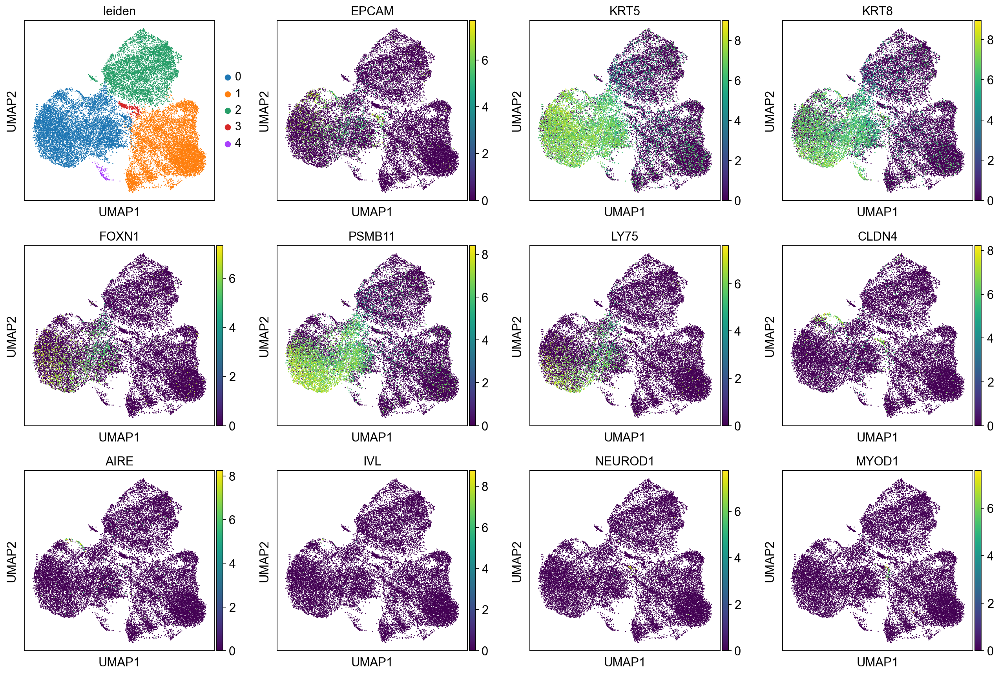

In [ ]:
# UMAP (Uniform Manifold Approximation and Projection) dimensionality reduction plot 
sc.pl.umap(xdata, color=['leiden', 'EPCAM', 'KRT5', 'KRT8', 'FOXN1', 'PSMB11', 'LY75','CLDN4','AIRE','IVL','NEUROD1','MYOD1']) 

* <span style="color: green;"><strong>Mesenchyme markers</strong></span>

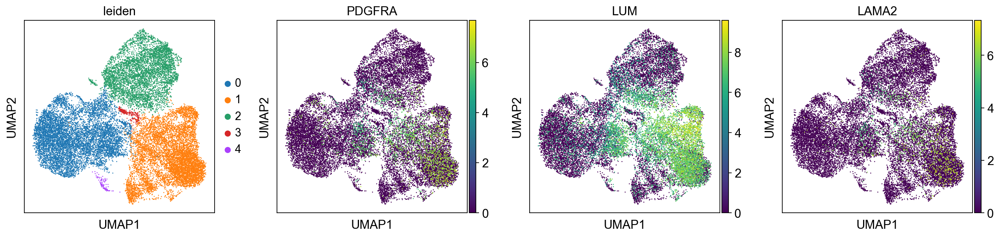

In [ ]:
# UMAP dimensionality reduction plot
sc.pl.umap(xdata, color=['leiden', 'PDGFRA', 'LUM', 'LAMA2']) 

### DEA  
Differential Expression Analysis (DEA) is a statistical method used to identify DEG between two or more groups or conditions in a gene expression dataset, in order to understand the changes associated with the different biological conditions. Our goal of the DEA is to identify genes that show statistically significant differences in expression levels of the TEC and Mesenchyme identified clusters. This will enable us to identify genes that are potentially important for the characterization of the specific tissue.

ranking genes
    finished (0:00:02)


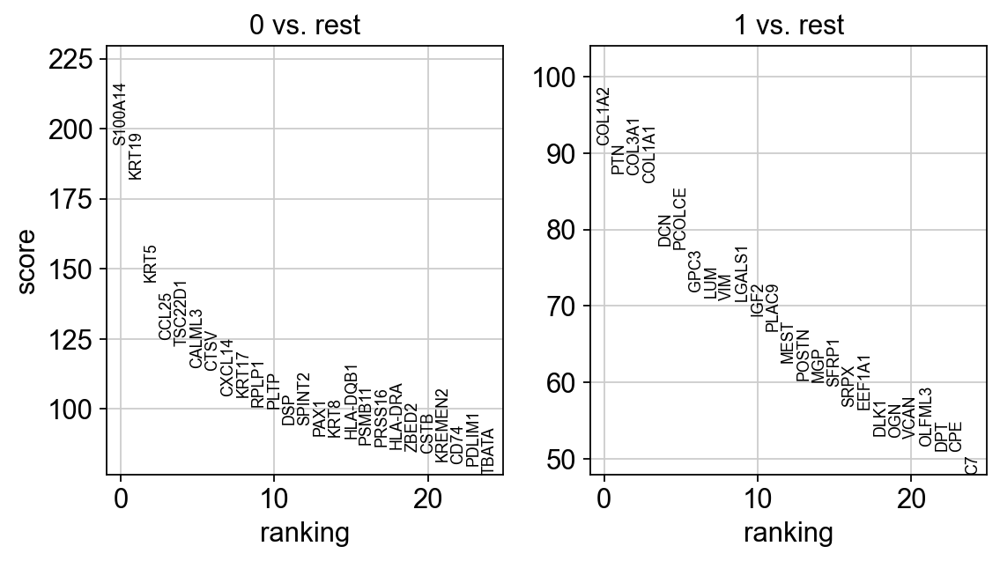

In [ ]:
# DEA using t-test for statistical significance of differential expression on the TEC and Mesenchyme clusters
sc.tl.rank_genes_groups(xdata, 'leiden', method='t-test', pts = True, groups=['0', '1'])     
sc.pl.rank_genes_groups(xdata, n_genes=25, sharey=False)                                     

* <span style="color: green;"><strong>Extract the genes per cluster</strong></span>

In [ ]:
# Define a function to flatten a nested dictionary - transform into a single-level dictionary structure, where each key is a unique combination of the original nested keys
def flatten_dict(d, parent_key='', sep='_'):
    items = []
    for k, v in d.items():
        new_key = parent_key + sep + k if parent_key else k
        if isinstance(v, dict):
            items.extend(flatten_dict(v, new_key, sep=sep).items())
        else:
            items.append((new_key, v))
    return dict(items)

In [ ]:
# Flatten the dictionary
flattened_dict = flatten_dict(xdata.uns)

# Create a DataFrame from the flattened dictionary
df = pd.DataFrame.from_dict(flattened_dict, orient='index', columns=['value'])

# Reset the DataFrame index and rename the columns
df.reset_index(inplace=True)
df.columns = ['key', 'value']

In [ ]:
# Extract the 'rank_genes_groups_names' value from the DataFrame
names = df.loc[df['key'] == 'rank_genes_groups_names', 'value'].iloc[0]

# Convert the record array to a DataFrame
names_df = pd.DataFrame(df.loc[df['key'] == 'rank_genes_groups_names', 'value'].values[0])

# Flatten the values and convert to a list
all_names = names_df.values.flatten().tolist()

# Create a new DataFrame with the gene names
names_df = pd.DataFrame({'names': all_names})

In [ ]:
# Specify the number of clusters
num_clusters = 2                                 

# Select the top genes
top_genes = all_names[:num_clusters * 25]       

# Split into clusters
clusters = []
for i in range(num_clusters):
    cluster = top_genes[i::num_clusters]
    clusters.append(cluster)

# Print the clusters
for i, cluster in enumerate(clusters):
    print(f"Cluster {i}:", cluster)

Cluster 0: ['S100A14', 'KRT19', 'KRT5', 'CCL25', 'TSC22D1', 'CALML3', 'CTSV', 'CXCL14', 'KRT17', 'RPLP1', 'PLTP', 'DSP', 'SPINT2', 'PAX1', 'KRT8', 'HLA-DQB1', 'PSMB11', 'PRSS16', 'HLA-DRA', 'ZBED2', 'CSTB', 'KREMEN2', 'CD74', 'PDLIM1', 'TBATA']
Cluster 1: ['COL1A2', 'PTN', 'COL3A1', 'COL1A1', 'DCN', 'PCOLCE', 'GPC3', 'LUM', 'VIM', 'LGALS1', 'IGF2', 'PLAC9', 'MEST', 'POSTN', 'MGP', 'SFRP1', 'SRPX', 'EEF1A1', 'DLK1', 'OGN', 'VCAN', 'OLFML3', 'DPT', 'CPE', 'C7']


In [ ]:
# Split the genes lists into TEC and Mesenchyme
list_tec = top_genes[::num_clusters]     # TEC DEG
list_mes = top_genes[1::num_clusters]    # Mesenchyme DEG

#### TEC genes

In [ ]:
# Extracting the cells that are assigned to the TEC cluster 0 = TEC
tecdata_bau = xdata[xdata.obs['leiden'].isin(['0']), :].copy()

In [ ]:
# Total number of cells and genes in the TEC cluster
print("Number of cells:", tecdata_bau.n_obs)
print("Number of genes:", tecdata_bau.n_vars)

Number of cells: 8365
Number of genes: 22288


In [ ]:
# Filtering min number of cells in which a gene should be expressed
sc.pp.filter_genes(tecdata_bau, min_cells=3) 

filtered out 2058 genes that are detected in less than 3 cells


In [ ]:
# Total number of cells and genes in the TEC cluster after filtering
print("Number of cells:", tecdata_bau.n_obs)
print("Number of genes:", tecdata_bau.n_vars)

Number of cells: 8365
Number of genes: 20230


#### Mesenchyme genes

In [ ]:
# Extracting the cells that are assigned to the Mesenchyme
mesdata_bau = xdata[xdata.obs['leiden'].isin(['1']), :].copy()

In [ ]:
# Total number of cells and genes in the Mesenchyme cluster
print("Number of cells:", mesdata_bau.n_obs)
print("Number of genes:", mesdata_bau.n_vars)

Number of cells: 8193
Number of genes: 22288


In [ ]:
# Filtering minimum number of cells in which a gene should be expressed
sc.pp.filter_genes(mesdata_bau, min_cells=3) 

filtered out 4082 genes that are detected in less than 3 cells


In [ ]:
# Total number of cells and genes in the Mesenchyme cluster after filtering
print("Number of cells:", mesdata_bau.n_obs)
print("Number of genes:", mesdata_bau.n_vars)

Number of cells: 8193
Number of genes: 18206


#### Re-clustering

In [ ]:
# Computing the neighborhood graph
sc.pp.neighbors(mesdata_bau, n_neighbors=10, n_pcs=40) 

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:00)


In [ ]:
# Embedding the neighborhood graph - PAGA graph calculation and UMAP embedding
sc.tl.leiden(mesdata_bau)
sc.tl.paga(mesdata_bau)                   
sc.pl.paga(mesdata_bau, plot=False)      
sc.tl.umap(mesdata_bau, init_pos='paga') 

running Leiden clustering
    finished (0:00:00)
running PAGA
    finished (0:00:00)
computing UMAP
    finished (0:00:15)


In [ ]:
# Leiden algorithm
sc.tl.leiden(mesdata_bau, resolution=0.1) 

running Leiden clustering
    finished (0:00:00)


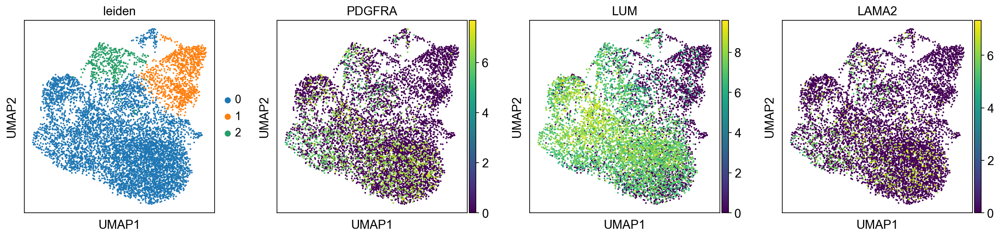

In [ ]:
# UMAP dimensionality reduction plot -> Mesenchyme markers
sc.pl.umap(mesdata_bau, color=['leiden', 'PDGFRA', 'LUM', 'LAMA2']) 

In [ ]:
# Exclude cluster 1
mesdata_bau = mesdata_bau[mesdata_bau.obs['leiden'].isin(['0', '2']), :].copy()

In [ ]:
# Merging the clusters
mesdata_bau.obs['leiden'] = '0'

In [ ]:
# Total number of cells and genes in the Mesenchyme cluster after filtering
print("Number of cells:", mesdata_bau.n_obs)
print("Number of genes:", mesdata_bau.n_vars)

Number of cells: 7117
Number of genes: 18206


# III. Merging 

## iPSC + TEC

In [ ]:
# iPSC
print("Number of iPS cells:", adata.n_obs)
print("Number of iPS genes:", adata.n_vars)

Number of iPS cells: 47530
Number of iPS genes: 21121


In [ ]:
# Primary thymus
print("Number of primary thymus cells:", xdata.n_obs)
print("Number of primary thymus genes:", xdata.n_vars)

Number of primary thymus cells: 22333
Number of primary thymus genes: 22288


In [ ]:
# Primary TEC
print("Number of TEC cells:", tecdata_bau.n_obs)
print("Number of TEC genes:", tecdata_bau.n_vars)

Number of TEC cells: 8365
Number of TEC genes: 20230


In [ ]:
# Merging iPSC and primary TEC
mdata_ax_TEC = ad.concat([adata, tecdata_bau], join="inner") 

In [ ]:
# Total number of cells and genes after merging
print("Number of cells:", mdata_ax_TEC.n_obs)
print("Number of genes:", mdata_ax_TEC.n_vars)

Number of cells: 55895
Number of genes: 15510


## iPSC + Mesenchyme

In [ ]:
# Primary Mesenchyme
print("Number of Mesenchyme cells:", mesdata_bau.n_obs)
print("Number of Mesenchyme genes:", mesdata_bau.n_vars)

Number of Mesenchyme cells: 7117
Number of Mesenchyme genes: 18206


In [ ]:
# Merging iPSC and primary Mesenchyme
mdata_ax_mes = ad.concat([adata, mesdata_bau], join="inner") 

In [ ]:
# Total number of cells and genes after merging
print("Number of cells:", mdata_ax_mes.n_obs)
print("Number of genes:", mdata_ax_mes.n_vars)

Number of cells: 54647
Number of genes: 14747


# IV. DEA Analysis - TEC  

In [ ]:
# Convert the 'leiden' column to 'category' dtype
mdata_ax_TEC.obs['leiden'] = mdata_ax_TEC.obs['leiden'].astype('category')

ranking genes
    finished (0:00:03)


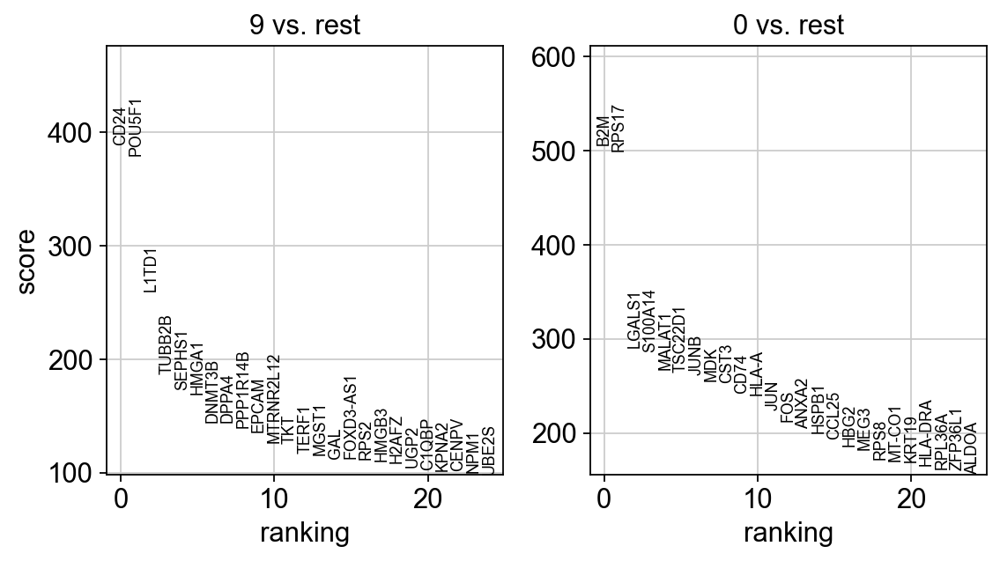

In [ ]:
# DEA using t-test for statistical significance of differential expression between iPSC ('9') and TEC ('0')
sc.tl.rank_genes_groups(mdata_ax_TEC, 'leiden', method='t-test', pts = True)      
sc.pl.rank_genes_groups(mdata_ax_TEC, n_genes=25, sharey=False)                   

In [ ]:
# Extract gene names, fraction of cells and fraction of cells from the union of the rest
names_df, pts_df, pts_rest_df, logFC_df, scores_df, pvals_df, pvals_adj_df = [
    pd.DataFrame(mdata_ax_TEC.uns['rank_genes_groups'][key]) 
    for key in [
        'names', 'pts', 'pts_rest', 'logfoldchanges', 'scores', 'pvals', 'pvals_adj'
    ]
]

# Sort by gene scores
sorted_names = names_df['9'].tolist()
pts_df_sorted = pts_df.reindex(sorted_names)
pts_rest_df_sorted = pts_rest_df.reindex(sorted_names)

# Round the values to 6 decimal places
pvals_adj_df = pvals_adj_df.round(6)

## iPSC Scores

In [ ]:
# Reset indices
pts_df_sorted, pts_rest_df_sorted = [df.reset_index(drop=True) for df in (pts_df_sorted, pts_rest_df_sorted)]

# Create a new DataFrame with column '9' from names_df = iPSC
iPSC_scores = pd.DataFrame({'iPSC_Genes': names_df['9'], 
                            'scores': scores_df['9'], 
                            'pvals_adj': pvals_adj_df['9'], 
                            'cell_fr': pts_df_sorted['9'], 
                            'cell_fr_rest': pts_rest_df_sorted['9'].values, 
                            'logFC': logFC_df['9']})
iPSC_scores

,iPSC_Genes,scores,pvals_adj,cell_fr,cell_fr_rest,logFC
0,CD24,389.084656,0.0,0.879928,0.035146,11.764726
1,POU5F1,379.103607,0.0,0.764696,0.002510,14.208526
2,L1TD1,259.841797,0.0,0.690827,0.029408,9.725310
3,TUBB2B,186.959717,0.0,0.584599,0.044232,7.753207
4,SEPHS1,172.579865,0.0,0.597496,0.068858,7.215489
...,...,...,...,...,...,...
15505,MALAT1,-267.475159,0.0,0.930065,1.000000,-4.294175
15506,S100A14,-286.340515,0.0,0.005070,0.917872,-14.445681
15507,LGALS1,-290.397034,0.0,0.041995,0.931261,-11.726996
15508,RPS17,-499.285034,0.0,0.190217,0.998207,-10.345947


In [ ]:
# Scatter plot iPSC
def plot_scatter_ipsc(data):
    plt.scatter(data['cell_fr'], data['logFC'], c='blue', alpha=0.6, edgecolors='white')
    plt.xlabel('cell_fr', fontsize=12)
    plt.ylabel('logFC', fontsize=12)
    plt.title('iPSC cell_fr vs logFC', fontsize=14)
    cbar = plt.colorbar()
    cbar.set_label('Gene Expression', fontsize=12)
    plt.grid(linestyle='--', alpha=0.5)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()

# Gene annotations iPSC
def annotate_gene_ipsc(data, threshold):
    genes_above_threshold = data[data['cell_fr'] > threshold]
    if not genes_above_threshold.empty:
        max_logFC_above_threshold_index = genes_above_threshold['logFC'].idxmax()
        max_logFC_above_threshold_gene = genes_above_threshold.loc[max_logFC_above_threshold_index, 'iPSC_Genes']
        max_logFC_above_threshold_value = genes_above_threshold.loc[max_logFC_above_threshold_index, 'logFC']
        max_logFC_above_threshold_score = genes_above_threshold.loc[max_logFC_above_threshold_index, 'scores']
        plt.annotate(f'{max_logFC_above_threshold_gene}\nlogFC: {max_logFC_above_threshold_value:.2f}\nScore: {max_logFC_above_threshold_score:.2f}',
                 xy=(genes_above_threshold.loc[max_logFC_above_threshold_index, 'cell_fr'], genes_above_threshold.loc[max_logFC_above_threshold_index, 'logFC']),
                 xytext=(-50, -23),
                 textcoords='offset points',
                 ha='center',
                 va='bottom',
                 fontsize=8,
                 color='red',
                 arrowprops=dict(arrowstyle='->', color='red'))

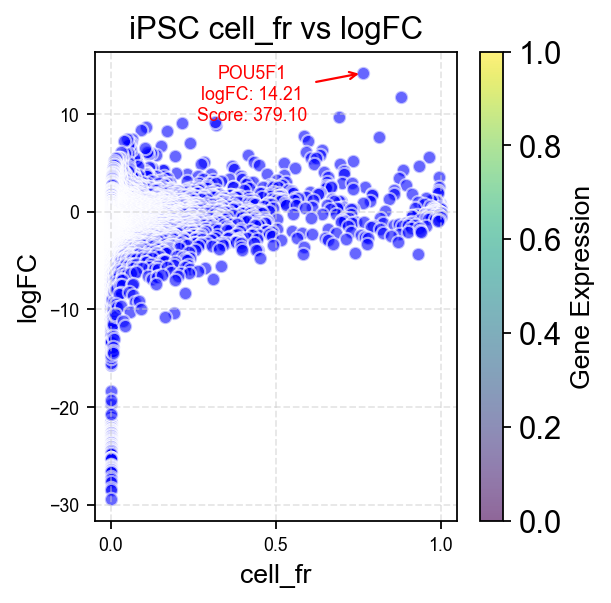

In [ ]:
# Constants
cell_fr_threshold = 0.75

# Plotting
plot_scatter_ipsc(iPSC_scores)
annotate_gene_ipsc(iPSC_scores, cell_fr_threshold)

plt.show()

### Z-scores

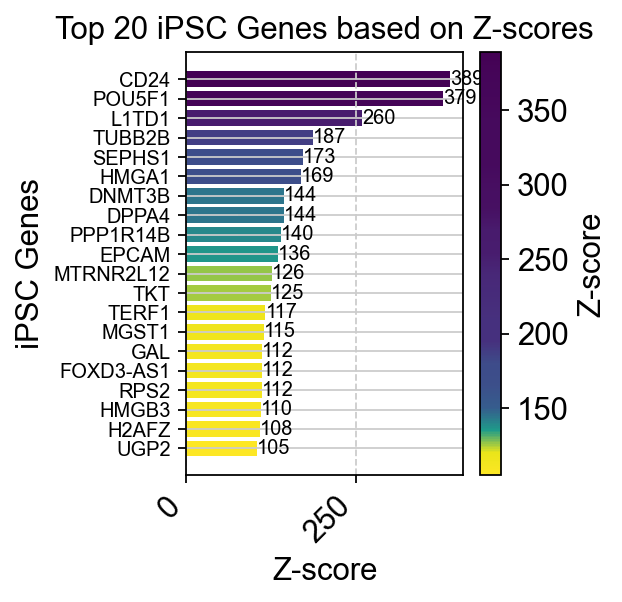

In [ ]:
# Subset the data 
positive_scores = iPSC_scores[iPSC_scores['scores'] > 0]
subset = positive_scores.head(20)  

# Custom colormap based on the 'scores' values
min_score = min(subset['scores'])
max_score = max(subset['scores'])
norm = plt.Normalize(min_score, max_score)
colors = plt.cm.viridis(norm(subset['scores']))
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Horizontal bar plot with separate bars for each data point
for i, (gene, score) in enumerate(zip(subset['iPSC_Genes'], subset['scores'])):
    plt.barh(gene, score, color=cmap(norm(score)))

plt.xlabel('Z-score')
plt.ylabel('iPSC Genes')
plt.title('Top 20 iPSC Genes based on Z-scores')
plt.gca().invert_yaxis()  

# Tick labels and rotation
plt.xticks(rotation=45, ha='right')
plt.yticks(fontsize=9)  

# Grid lines
plt.grid(axis='x', linestyle='--')

# Value annotations on the bars 
for i, score in enumerate(subset['scores']):
    plt.text(score, i, f'{score:.0f}', va='center', fontsize=9)

# Color scale on the right
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), ax=plt.gca(), orientation='vertical')
cbar.set_label('Z-score')

plt.tight_layout()  
plt.show()

### logFC

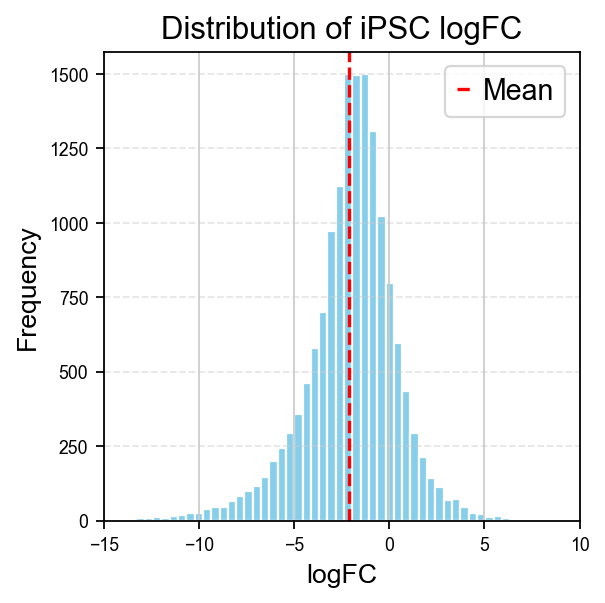

In [ ]:
# Histogram
plt.hist(iPSC_scores['logFC'], bins=100, color='skyblue', edgecolor='white')  

# Set the x-axis and y-axis labels and title
plt.xlabel('logFC', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of iPSC logFC', fontsize=14)

# Grid lines
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Customize the appearance of the plot
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlim([-15, 10])  

# Vertical line at the mean
mean_logFC = iPSC_scores['logFC'].mean()
plt.axvline(mean_logFC, color='red', linestyle='--', linewidth=1.5, label='Mean')

# Legend
plt.legend()

plt.tight_layout()
plt.show()

## TEC Scores

In [ ]:
# Extract TEC data
sorted_names = names_df['0'].tolist()
pts_df_sorted = pts_df.reindex(sorted_names)
pts_rest_df_sorted = pts_rest_df.reindex(sorted_names)

# Round the values to 6 decimal places
pvals_adj_df = pvals_adj_df.round(6)

In [ ]:
# Reset indices
pts_df_sorted, pts_rest_df_sorted = [df.reset_index(drop=True) for df in (pts_df_sorted, pts_rest_df_sorted)]

# Create a new DataFrame with column '9' from names_df = iPSC
TEC_scores = pd.DataFrame({'TEC_Genes': names_df['0'], 
                            'scores': scores_df['0'], 
                            'pvals_adj': pvals_adj_df['0'], 
                            'cell_fr': pts_df_sorted['0'], 
                            'cell_fr_rest': pts_rest_df_sorted['0'].values, 
                            'logFC': logFC_df['0']})
TEC_scores

,TEC_Genes,scores,pvals_adj,cell_fr,cell_fr_rest,logFC
0,B2M,506.107788,0.0,0.997848,0.163434,10.827758
1,RPS17,499.285034,0.0,0.998207,0.190217,10.345947
2,LGALS1,290.397034,0.0,0.931261,0.041995,11.726996
3,S100A14,286.340515,0.0,0.917872,0.005070,14.445681
4,MALAT1,267.475159,0.0,1.000000,0.930065,4.294175
...,...,...,...,...,...,...
15505,SEPHS1,-172.579865,0.0,0.068858,0.597496,-7.215489
15506,TUBB2B,-186.959717,0.0,0.044232,0.584599,-7.753207
15507,L1TD1,-259.841797,0.0,0.029408,0.690827,-9.725310
15508,POU5F1,-379.103607,0.0,0.002510,0.764696,-14.208526


In [ ]:
# # Scatter plot TEC
# def plot_scatter_tec(data):
#     plt.scatter(data['cell_fr'], data['logFC'], c='blue', alpha=0.6, edgecolors='white')
#     plt.xlabel('cell_fr', fontsize=12)
#     plt.ylabel('logFC', fontsize=12)
#     plt.title('TEC cell_fr vs logFC', fontsize=14)
#     cbar = plt.colorbar()
#     cbar.set_label('Gene Expression', fontsize=12)
#     plt.grid(linestyle='--', alpha=0.5)
#     plt.xticks(fontsize=8)
#     plt.yticks(fontsize=8)
#     plt.tight_layout()

# # Gene data TEC
# def annotate_gene_tec(data, threshold):
#     genes_above_threshold = data[data['cell_fr'] > threshold]
#     if not genes_above_threshold.empty:
#         max_logFC_above_threshold_index = genes_above_threshold['logFC'].idxmax()
#         max_logFC_above_threshold_gene = genes_above_threshold.loc[max_logFC_above_threshold_index, 'TEC_Genes']
#         max_logFC_above_threshold_value = genes_above_threshold.loc[max_logFC_above_threshold_index, 'logFC']
#         max_logFC_above_threshold_score = genes_above_threshold.loc[max_logFC_above_threshold_index, 'scores']
#         plt.annotate(f'{max_logFC_above_threshold_gene}\nlogFC: {max_logFC_above_threshold_value:.2f}\nScore: {max_logFC_above_threshold_score:.2f}',
#                  xy=(genes_above_threshold.loc[max_logFC_above_threshold_index, 'cell_fr'], genes_above_threshold.loc[max_logFC_above_threshold_index, 'logFC']),
#                  xytext=(-50, -23),
#                  textcoords='offset points',
#                  ha='center',
#                  va='bottom',
#                  fontsize=8,
#                  color='red',
#                  arrowprops=dict(arrowstyle='->', color='red'))

In [ ]:
# # Constants
# cell_fr_threshold = 0.75

# # Plotting
# plot_scatter_tec(TEC_scores)
# annotate_gene_tec(TEC_scores, cell_fr_threshold)

# plt.show()

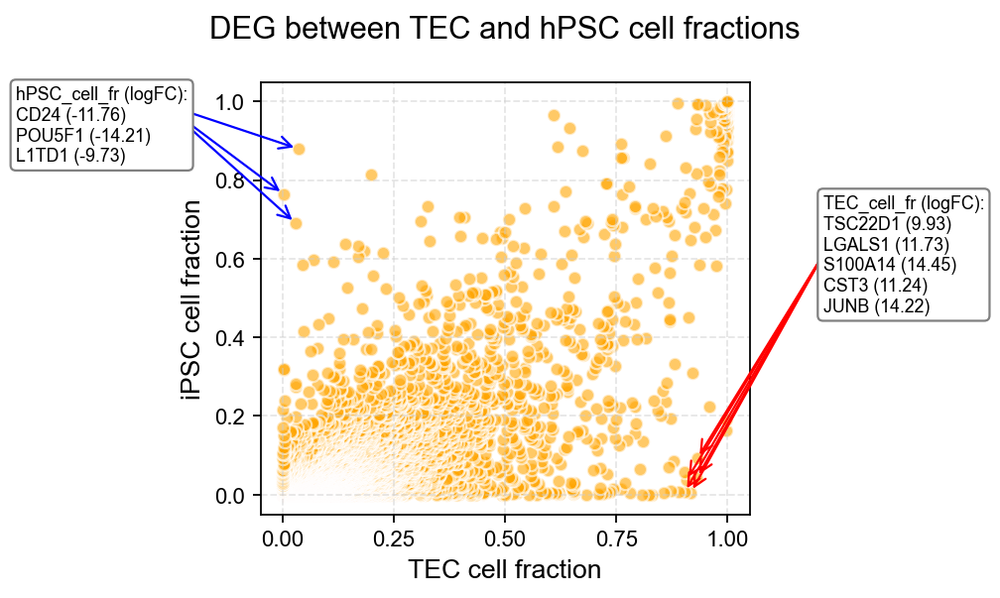

In [ ]:
# Scatter Plot of cell_fr (TEC) vs cell_fr_rest (iPSC)
plt.scatter(TEC_scores['cell_fr'], TEC_scores['cell_fr_rest'], c='orange', alpha=0.6, edgecolors='white')
plt.xlabel('TEC cell fraction', fontsize=12)
plt.ylabel('iPSC cell fraction', fontsize=12)
plt.title('DEG between TEC and hPSC cell fractions', fontsize=14, pad=20)  
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.grid(linestyle='--', alpha=0.5)

# Annotate the top 5 genes with the highest cell_fr and lowest in the rest
top_x_genes = TEC_scores[np.logical_and(TEC_scores['cell_fr'] > 0.9, TEC_scores['cell_fr_rest'] < 0.1)].nlargest(5, 'cell_fr')
top_y_genes = TEC_scores[np.logical_and(TEC_scores['cell_fr'] < 0.1, TEC_scores['cell_fr_rest'] > 0.6)].nlargest(5, 'cell_fr_rest')

# Create arrows top_x_genes
for _, row in top_x_genes.iterrows():
    plt.annotate('', xy=(row['cell_fr'], row['cell_fr_rest']),
                 xytext=(1.15, 0.6),
                 textcoords='axes fraction',
                 arrowprops=dict(arrowstyle='->', color='red'))

# Create arrows top_y_genes
for _, row in top_y_genes.iterrows():
    plt.annotate('', xy=(row['cell_fr'], row['cell_fr_rest']),
                 xytext=(-0.2, 0.95),
                 textcoords='axes fraction',
                 arrowprops=dict(arrowstyle='->', color='blue'))

# Gene list for top_x_genes
gene_list_box_x = plt.text(1.15, 0.6, 'TEC_cell_fr (logFC):\n' + '\n'.join(f"{gene} ({logFC:.2f})" for gene, logFC in zip(top_x_genes['TEC_Genes'], top_x_genes['logFC'])),
                           transform=plt.gca().transAxes,
                           verticalalignment='center',
                           horizontalalignment='left',
                           bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'),
                           fontsize=8)

# Gene list for top_y_genes
gene_list_box_y = plt.text(-0.5, 0.9, 'hPSC_cell_fr (logFC):\n' + '\n'.join(f"{gene} ({logFC:.2f})" for gene, logFC in zip(top_y_genes['TEC_Genes'], top_y_genes['logFC'])),
                           transform=plt.gca().transAxes,
                           verticalalignment='center',
                           horizontalalignment='left',
                           bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'),
                           fontsize=8)
plt.show()

### Z-scores

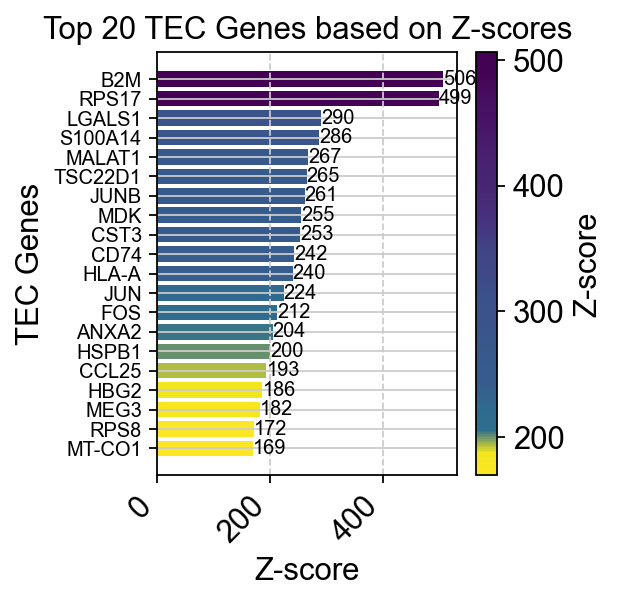

In [ ]:
# Select the data 
positive_scores = TEC_scores[TEC_scores['scores'] > 0]
subset = positive_scores.head(20)  

# Custom colormap based on the 'scores' values
min_score = min(subset['scores'])
max_score = max(subset['scores'])
norm = plt.Normalize(min_score, max_score)
colors = plt.cm.viridis(norm(subset['scores']))
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Horizontal bar plot with separate bars for each data point
for i, (gene, score) in enumerate(zip(subset['TEC_Genes'], subset['scores'])):
    plt.barh(gene, score, color=cmap(norm(score)))

plt.xlabel('Z-score')
plt.ylabel('TEC Genes')
plt.title('Top 20 TEC Genes based on Z-scores')
plt.gca().invert_yaxis()  # Invert y-axis to display genes from top to bottom

# Tick labels and rotation
plt.xticks(rotation=45, ha='right')
plt.yticks(fontsize=9)  # Adjust the font size of the y-axis tick labels

# Grid lines
plt.grid(axis='x', linestyle='--')

# Value annotations on the bars 
for i, score in enumerate(subset['scores']):
    plt.text(score, i, f'{score:.0f}', va='center', fontsize=9)

# Color scale on the right
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), ax=plt.gca(), orientation='vertical')
cbar.set_label('Z-score')

plt.tight_layout()  # Adjust the layout to prevent overlapping elements
plt.show()

### logFC

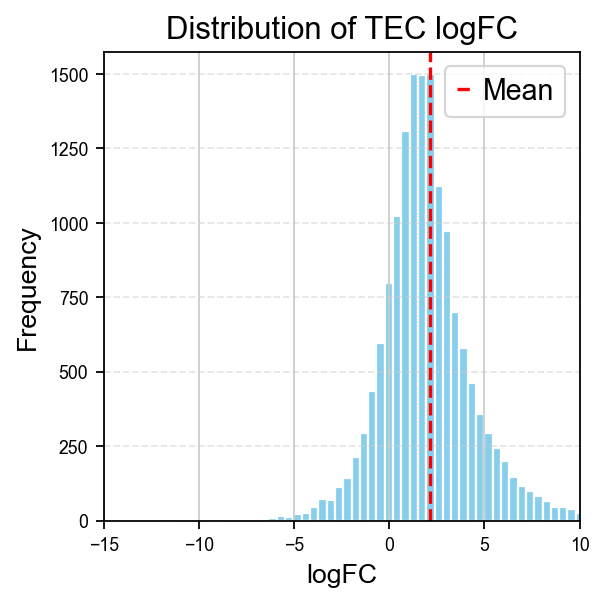

In [ ]:
# Histogram
plt.hist(TEC_scores['logFC'], bins=100, color='skyblue', edgecolor='white')  
plt.xlabel('logFC', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of TEC logFC', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlim([-15, 10])  

# Vertical line at the mean
mean_logFC = TEC_scores['logFC'].mean()
plt.axvline(mean_logFC, color='red', linestyle='--', linewidth=1.5, label='Mean')

# Legend
plt.legend()
plt.tight_layout()

plt.show()

## Extract top TEC DEG

In [ ]:
# Flatten the dictionary
flattened_dict = flatten_dict(mdata_ax_TEC.uns)

# Create a DataFrame from the flattened dictionary
df = pd.DataFrame.from_dict(flattened_dict, orient='index', columns=['value'])

# Reset the DataFrame index and rename the columns
df.reset_index(inplace=True)
df.columns = ['key', 'value']

In [ ]:
# Extract the 'rank_genes_groups_names' value from the DataFrame
names = df.loc[df['key'] == 'rank_genes_groups_names', 'value'].iloc[0]

# Convert the record array to a DataFrame
names_df = pd.DataFrame(df.loc[df['key'] == 'rank_genes_groups_names', 'value'].values[0])

# Flatten the values and convert to a list
all_names = names_df.values.flatten().tolist()

# Create a new DataFrame with the gene names
names_df = pd.DataFrame({'names': all_names})

In [ ]:
# Specify the number of clusters
num_clusters = 2                                

# Select the top genes
top_genes = all_names[:num_clusters * 100]       

# Split into clusters
clusters = []
for i in range(num_clusters):
    cluster = top_genes[i::num_clusters]
    clusters.append(cluster)

# Split into clusters
top100_DEG_iPSC_to_TEC = top_genes[::num_clusters]   # iPSC
top100_DEG_TEC = top_genes[1::num_clusters]          # primary TEC

In [ ]:
# Save iPSC DEG as .csv
top100_DEG_iPSC_to_TEC_df = pd.DataFrame(top100_DEG_iPSC_to_TEC)
file_path = os.path.join(results, 'top100_DEG_iPSC_to_TEC.csv')

top100_DEG_iPSC_to_TEC_df.to_csv(file_path, index=False)
print("CSV file saved successfully.")

CSV file saved successfully.


In [ ]:
# Save TEC DEG as .csv
top100_DEG_TEC_df = pd.DataFrame(top100_DEG_TEC)
file_path = os.path.join(results, 'top100_DEG_TEC.csv')

top100_DEG_TEC_df.to_csv(file_path, index=False)
print("CSV file saved successfully.")

CSV file saved successfully.


# V. DEA Analysis - Mesenchyme  

In [ ]:
# Convert the 'leiden' column to 'category' dtype
mdata_ax_mes.obs['leiden'] = mdata_ax_mes.obs['leiden'].astype('category')

ranking genes
    finished (0:00:03)


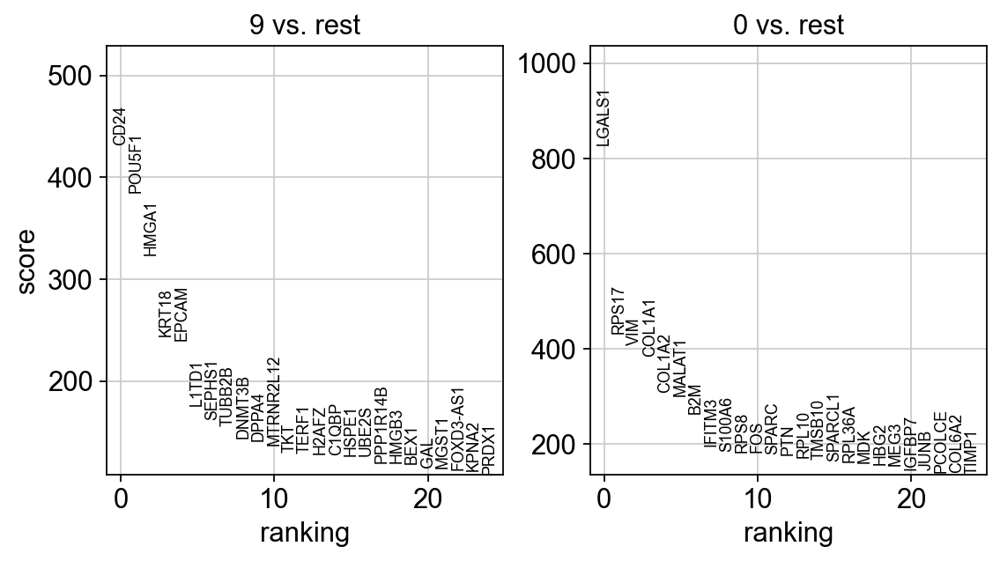

In [ ]:
# DEA using t-test for statistical significance of differential expression between iPSC ('9') and Mesenchyme ('0')
sc.tl.rank_genes_groups(mdata_ax_mes, 'leiden', method='t-test', pts = True)                        
sc.pl.rank_genes_groups(mdata_ax_mes, n_genes=25, sharey=False)                                    

In [ ]:
# Extract gene names, fraction of cells and fraction of cells from the union of the rest
names_df, pts_df, pts_rest_df, logFC_df, scores_df, pvals_df, pvals_adj_df = [
    pd.DataFrame(mdata_ax_mes.uns['rank_genes_groups'][key]) 
    for key in [
        'names', 'pts', 'pts_rest', 'logfoldchanges', 'scores', 'pvals', 'pvals_adj'
    ]
]

# Sort by gene scores
sorted_names = names_df['9'].tolist()
pts_df_sorted = pts_df.reindex(sorted_names)
pts_rest_df_sorted = pts_rest_df.reindex(sorted_names)

# Round the values to 6 decimal places
pvals_adj_df = pvals_adj_df.round(6)

## iPSC Scores

In [ ]:
# Reset indices
pts_df_sorted, pts_rest_df_sorted = [df.reset_index(drop=True) for df in (pts_df_sorted, pts_rest_df_sorted)]

# Create a new DataFrame with column '9' from names_df = iPSC
iPSC_scores = pd.DataFrame({'iPSC_Genes': names_df['9'], 
                            'scores': scores_df['9'], 
                            'pvals_adj': pvals_adj_df['9'], 
                            'cell_fr': pts_df_sorted['9'], 
                            'cell_fr_rest': pts_rest_df_sorted['9'].values, 
                            'logFC': logFC_df['9']})
iPSC_scores

,iPSC_Genes,scores,pvals_adj,cell_fr,cell_fr_rest,logFC
0,CD24,431.820801,0.0,0.879928,0.019109,12.673274
1,POU5F1,384.420471,0.0,0.764696,0.000843,15.665023
2,HMGA1,323.519226,0.0,0.813612,0.028804,11.105990
3,KRT18,243.875702,0.0,0.695392,0.030631,9.542215
4,EPCAM,239.639694,0.0,0.592026,0.008009,10.386047
...,...,...,...,...,...,...
14742,COL1A2,-308.667877,0.0,0.022323,0.951665,-13.485788
14743,COL1A1,-384.014954,0.0,0.028803,0.975692,-13.914485
14744,VIM,-408.335205,0.0,0.220345,0.994520,-10.046390
14745,RPS17,-431.893219,0.0,0.190217,0.994239,-10.143420


In [ ]:
# # Scatter plot iPSC
# def plot_scatter_ipsc(data):
#     plt.scatter(data['cell_fr'], data['logFC'], c='blue', alpha=0.6, edgecolors='white')
#     plt.xlabel('cell_fr', fontsize=12)
#     plt.ylabel('logFC', fontsize=12)
#     plt.title('iPSC cell_fr vs logFC', fontsize=14)
#     cbar = plt.colorbar()
#     cbar.set_label('Gene Expression', fontsize=12)
#     plt.grid(linestyle='--', alpha=0.5)
#     plt.xticks(fontsize=8)
#     plt.yticks(fontsize=8)
#     plt.tight_layout()

# # Gene annotations iPSC
# def annotate_gene_ipsc(data, threshold):
#     genes_above_threshold = data[data['cell_fr'] > threshold]
#     if not genes_above_threshold.empty:
#         max_logFC_above_threshold_index = genes_above_threshold['logFC'].idxmax()
#         max_logFC_above_threshold_gene = genes_above_threshold.loc[max_logFC_above_threshold_index, 'iPSC_Genes']
#         max_logFC_above_threshold_value = genes_above_threshold.loc[max_logFC_above_threshold_index, 'logFC']
#         max_logFC_above_threshold_score = genes_above_threshold.loc[max_logFC_above_threshold_index, 'scores']
#         plt.annotate(f'{max_logFC_above_threshold_gene}\nlogFC: {max_logFC_above_threshold_value:.2f}\nScore: {max_logFC_above_threshold_score:.2f}',
#                  xy=(genes_above_threshold.loc[max_logFC_above_threshold_index, 'cell_fr'], genes_above_threshold.loc[max_logFC_above_threshold_index, 'logFC']),
#                  xytext=(-50, -23),
#                  textcoords='offset points',
#                  ha='center',
#                  va='bottom',
#                  fontsize=8,
#                  color='red',
#                  arrowprops=dict(arrowstyle='->', color='red'))

In [ ]:
# # Constants
# cell_fr_threshold = 0.75

# # Plotting
# plot_scatter_ipsc(iPSC_scores)
# annotate_gene_ipsc(iPSC_scores, cell_fr_threshold)

# plt.show()

### Z-scores

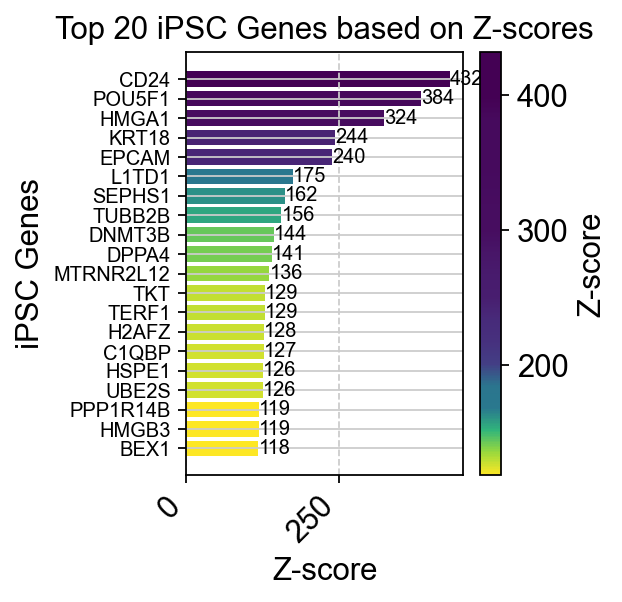

In [ ]:
# Subset the data 
positive_scores = iPSC_scores[iPSC_scores['scores'] > 0]
subset = positive_scores.head(20)  

# Custom colormap based on the 'scores' values
min_score = min(subset['scores'])
max_score = max(subset['scores'])
norm = plt.Normalize(min_score, max_score)
colors = plt.cm.viridis(norm(subset['scores']))
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Horizontal bar plot with separate bars for each data point
for i, (gene, score) in enumerate(zip(subset['iPSC_Genes'], subset['scores'])):
    plt.barh(gene, score, color=cmap(norm(score)))

plt.xlabel('Z-score')
plt.ylabel('iPSC Genes')
plt.title('Top 20 iPSC Genes based on Z-scores')
plt.gca().invert_yaxis()  

# Tick labels and rotation
plt.xticks(rotation=45, ha='right')
plt.yticks(fontsize=9)  

# Grid lines
plt.grid(axis='x', linestyle='--')

# Value annotations on the bars 
for i, score in enumerate(subset['scores']):
    plt.text(score, i, f'{score:.0f}', va='center', fontsize=9)

# Color scale on the right
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), ax=plt.gca(), orientation='vertical')
cbar.set_label('Z-score')

plt.tight_layout()  
plt.show()

### logFC

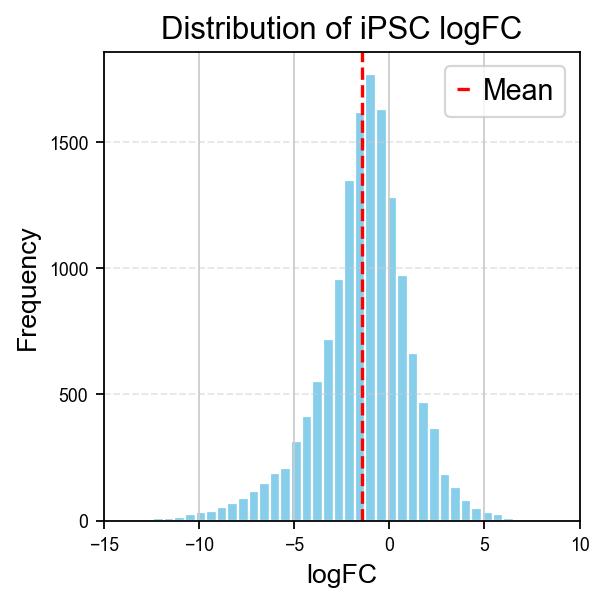

In [ ]:
# Histogram
plt.hist(iPSC_scores['logFC'], bins=100, color='skyblue', edgecolor='white')  

# Set the x-axis and y-axis labels and title
plt.xlabel('logFC', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of iPSC logFC', fontsize=14)

# Grid lines
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Customize the appearance of the plot
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlim([-15, 10])  

# Vertical line at the mean
mean_logFC = iPSC_scores['logFC'].mean()
plt.axvline(mean_logFC, color='red', linestyle='--', linewidth=1.5, label='Mean')

# Legend
plt.legend()

plt.tight_layout()
plt.show()

## Mesenchyme Scores

In [ ]:
# Extract Mesenchyme data
sorted_names = names_df['0'].tolist()
pts_df_sorted = pts_df.reindex(sorted_names)
pts_rest_df_sorted = pts_rest_df.reindex(sorted_names)

# Round the values to 6 decimal places
pvals_adj_df = pvals_adj_df.round(6)

In [ ]:
# Reset indices
pts_df_sorted, pts_rest_df_sorted = [df.reset_index(drop=True) for df in (pts_df_sorted, pts_rest_df_sorted)]

# Create a new DataFrame with column '9' from names_df = iPSC
MES_scores = pd.DataFrame({'Mesenchyme_Genes': names_df['0'], 
                            'scores': scores_df['0'], 
                            'pvals_adj': pvals_adj_df['0'], 
                            'cell_fr': pts_df_sorted['0'], 
                            'cell_fr_rest': pts_rest_df_sorted['0'].values, 
                            'logFC': logFC_df['0']})
MES_scores

,Mesenchyme_Genes,scores,pvals_adj,cell_fr,cell_fr_rest,logFC
0,LGALS1,828.730652,0.0,0.997892,0.041995,13.882361
1,RPS17,431.893219,0.0,0.994239,0.190217,10.143420
2,VIM,408.335205,0.0,0.994520,0.220345,10.046390
3,COL1A1,384.014954,0.0,0.975692,0.028803,13.914485
4,COL1A2,308.667877,0.0,0.951665,0.022323,13.485788
...,...,...,...,...,...,...
14742,EPCAM,-239.639694,0.0,0.008009,0.592026,-10.386047
14743,KRT18,-243.875702,0.0,0.030631,0.695392,-9.542215
14744,HMGA1,-323.519226,0.0,0.028804,0.813612,-11.105990
14745,POU5F1,-384.420471,0.0,0.000843,0.764696,-15.665023


In [ ]:
# Scatter plot Mesenchyme
def plot_scatter_mes(data):
    plt.scatter(data['cell_fr'], data['logFC'], c='blue', alpha=0.6, edgecolors='white')
    plt.xlabel('cell_fr', fontsize=12)
    plt.ylabel('logFC', fontsize=12)
    plt.title('Mesenchyme cell_fr vs logFC', fontsize=14)
    cbar = plt.colorbar()
    cbar.set_label('Gene Expression', fontsize=12)
    plt.grid(linestyle='--', alpha=0.5)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()

# Gene data TEC
def annotate_gene_mes(data, threshold):
    genes_above_threshold = data[data['cell_fr'] > threshold]
    if not genes_above_threshold.empty:
        max_logFC_above_threshold_index = genes_above_threshold['logFC'].idxmax()
        max_logFC_above_threshold_gene = genes_above_threshold.loc[max_logFC_above_threshold_index, 'Mesenchyme_Genes']
        max_logFC_above_threshold_value = genes_above_threshold.loc[max_logFC_above_threshold_index, 'logFC']
        max_logFC_above_threshold_score = genes_above_threshold.loc[max_logFC_above_threshold_index, 'scores']
        plt.annotate(f'{max_logFC_above_threshold_gene}\nlogFC: {max_logFC_above_threshold_value:.2f}\nScore: {max_logFC_above_threshold_score:.2f}',
                 xy=(genes_above_threshold.loc[max_logFC_above_threshold_index, 'cell_fr'], genes_above_threshold.loc[max_logFC_above_threshold_index, 'logFC']),
                 xytext=(-50, -23),
                 textcoords='offset points',
                 ha='center',
                 va='bottom',
                 fontsize=8,
                 color='red',
                 arrowprops=dict(arrowstyle='->', color='red'))

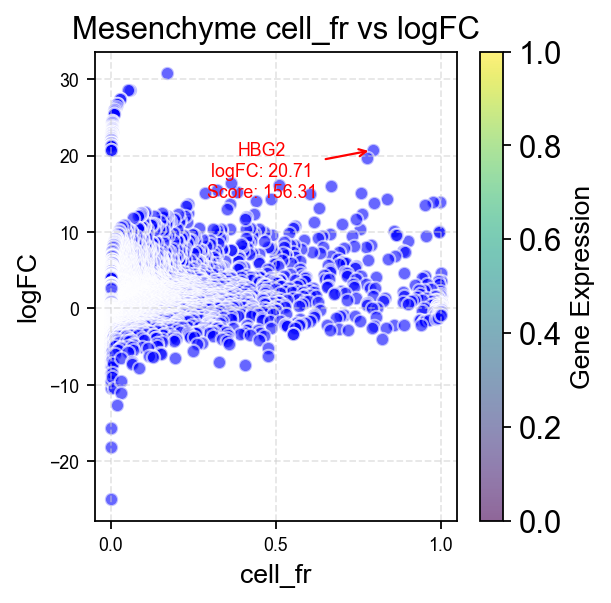

In [ ]:
# Constants
cell_fr_threshold = 0.75

# Plotting
plot_scatter_mes(MES_scores)
annotate_gene_mes(MES_scores, cell_fr_threshold)

plt.show()

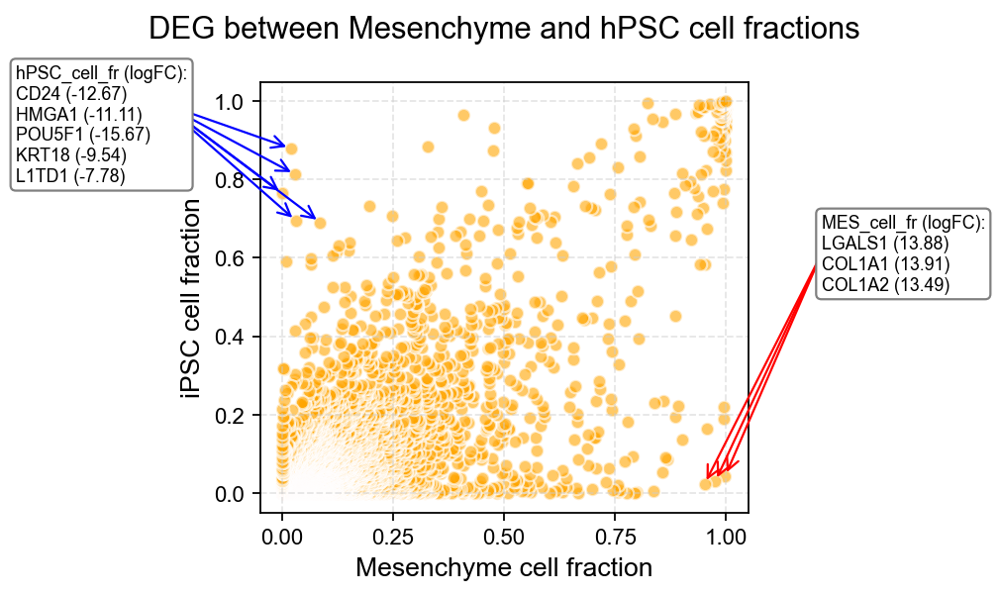

In [ ]:
# Scatter Plot of cell_fr (Mesenchyme) vs cell_fr_rest (iPSC)
plt.scatter(MES_scores['cell_fr'], MES_scores['cell_fr_rest'], c='orange', alpha=0.6, edgecolors='white')
plt.xlabel('Mesenchyme cell fraction', fontsize=12)
plt.ylabel('iPSC cell fraction', fontsize=12)
plt.title('DEG between Mesenchyme and hPSC cell fractions', fontsize=14, pad=20)  
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.grid(linestyle='--', alpha=0.5)

# Annotate the top 5 genes with the highest cell_fr and lowest in the rest
top_x_genes = MES_scores[np.logical_and(MES_scores['cell_fr'] > 0.9, MES_scores['cell_fr_rest'] < 0.1)].nlargest(5, 'cell_fr')
top_y_genes = MES_scores[np.logical_and(MES_scores['cell_fr'] < 0.1, MES_scores['cell_fr_rest'] > 0.6)].nlargest(5, 'cell_fr_rest')

# Create arrows top_x_genes
for _, row in top_x_genes.iterrows():
    plt.annotate('', xy=(row['cell_fr'], row['cell_fr_rest']),
                 xytext=(1.15, 0.6),
                 textcoords='axes fraction',
                 arrowprops=dict(arrowstyle='->', color='red'))

# Create arrows top_y_genes
for _, row in top_y_genes.iterrows():
    plt.annotate('', xy=(row['cell_fr'], row['cell_fr_rest']),
                 xytext=(-0.2, 0.95),
                 textcoords='axes fraction',
                 arrowprops=dict(arrowstyle='->', color='blue'))

# Gene list for top_x_genes
gene_list_box_x = plt.text(1.15, 0.6, 'MES_cell_fr (logFC):\n' + '\n'.join(f"{gene} ({logFC:.2f})" for gene, logFC in zip(top_x_genes['Mesenchyme_Genes'], top_x_genes['logFC'])),
                           transform=plt.gca().transAxes,
                           verticalalignment='center',
                           horizontalalignment='left',
                           bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'),
                           fontsize=8)

# Gene list for top_y_genes
gene_list_box_y = plt.text(-0.5, 0.9, 'hPSC_cell_fr (logFC):\n' + '\n'.join(f"{gene} ({logFC:.2f})" for gene, logFC in zip(top_y_genes['Mesenchyme_Genes'], top_y_genes['logFC'])),
                           transform=plt.gca().transAxes,
                           verticalalignment='center',
                           horizontalalignment='left',
                           bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'),
                           fontsize=8)
plt.show()

### Z-scores

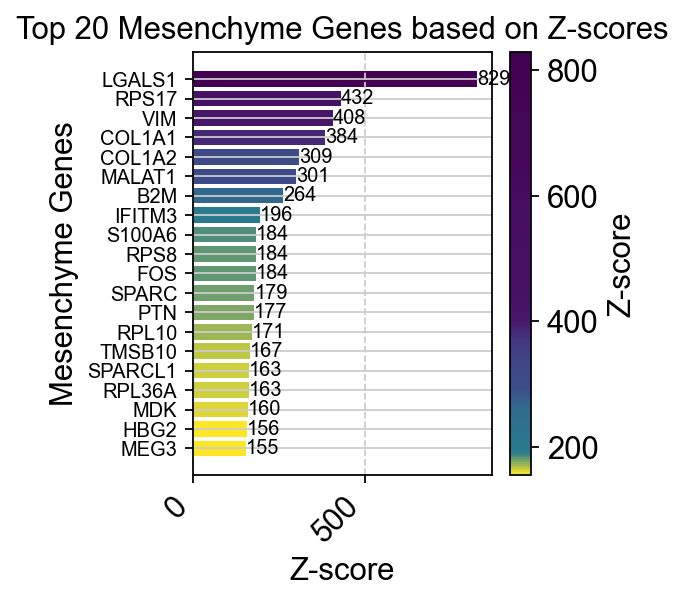

In [ ]:
# Select the data 
positive_scores = MES_scores[MES_scores['scores'] > 0]
subset = positive_scores.head(20)  

# Custom colormap based on the 'scores' values
min_score = min(subset['scores'])
max_score = max(subset['scores'])
norm = plt.Normalize(min_score, max_score)
colors = plt.cm.viridis(norm(subset['scores']))
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Horizontal bar plot with separate bars for each data point
for i, (gene, score) in enumerate(zip(subset['Mesenchyme_Genes'], subset['scores'])):
    plt.barh(gene, score, color=cmap(norm(score)))

plt.xlabel('Z-score')
plt.ylabel('Mesenchyme Genes')
plt.title('Top 20 Mesenchyme Genes based on Z-scores')
plt.gca().invert_yaxis()  # Invert y-axis to display genes from top to bottom

# Tick labels and rotation
plt.xticks(rotation=45, ha='right')
plt.yticks(fontsize=9)  # Adjust the font size of the y-axis tick labels

# Grid lines
plt.grid(axis='x', linestyle='--')

# Value annotations on the bars 
for i, score in enumerate(subset['scores']):
    plt.text(score, i, f'{score:.0f}', va='center', fontsize=9)

# Color scale on the right
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), ax=plt.gca(), orientation='vertical')
cbar.set_label('Z-score')

plt.tight_layout()  
plt.show()

### logFC

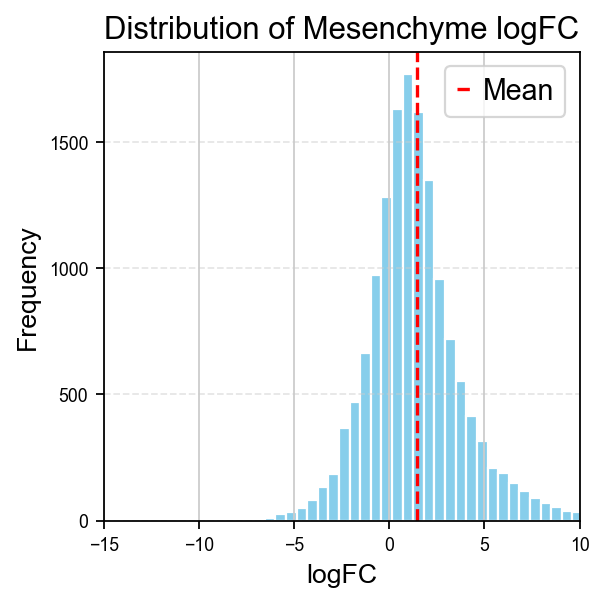

In [ ]:
# Histogram
plt.hist(MES_scores['logFC'], bins=100, color='skyblue', edgecolor='white')  
plt.xlabel('logFC', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of Mesenchyme logFC', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlim([-15, 10])  

# Vertical line at the mean
mean_logFC = MES_scores['logFC'].mean()
plt.axvline(mean_logFC, color='red', linestyle='--', linewidth=1.5, label='Mean')

# Legend
plt.legend()
plt.tight_layout()

plt.show()

In [ ]:
# Flatten the dictionary
flattened_dict = flatten_dict(mdata_ax_mes.uns)

# Create a DataFrame from the flattened dictionary
df = pd.DataFrame.from_dict(flattened_dict, orient='index', columns=['value'])

# Reset the DataFrame index and rename the columns
df.reset_index(inplace=True)
df.columns = ['key', 'value']

In [ ]:
# Extract the 'rank_genes_groups_names' value from the DataFrame
names = df.loc[df['key'] == 'rank_genes_groups_names', 'value'].iloc[0]

# Convert the record array to a DataFrame
names_df = pd.DataFrame(df.loc[df['key'] == 'rank_genes_groups_names', 'value'].values[0])

# Flatten the values and convert to a list
all_names = names_df.values.flatten().tolist()

# Create a new DataFrame with the gene names
names_df = pd.DataFrame({'names': all_names})

In [ ]:
# Specify the number of clusters
num_clusters = 2                                

# Select the top genes
top_genes = all_names[:num_clusters * 100]       

# Split into clusters
clusters = []
for i in range(num_clusters):
    cluster = top_genes[i::num_clusters]
    clusters.append(cluster)

# Split into clusters
top100_DEG_iPSC_to_Mes = top_genes[::num_clusters]   # iPSC
top100_DEG_Mes = top_genes[1::num_clusters]          # primary Mes

In [ ]:
# Save iPSC DEG as .csv
top100_DEG_iPSC_to_Mes_df = pd.DataFrame(top100_DEG_iPSC_to_Mes)
file_path = os.path.join(results, 'top100_DEG_iPSC_to_Mes.csv')

top100_DEG_iPSC_to_Mes_df.to_csv(file_path, index=False)
print("CSV file saved successfully.")

CSV file saved successfully.


In [ ]:
# Save Mes DEG as .csv
top100_DEG_Mes_df = pd.DataFrame(top100_DEG_Mes)
file_path = os.path.join(results, 'top100_DEG_Mes.csv')

top100_DEG_Mes_df.to_csv(file_path, index=False)
print("CSV file saved successfully.")

CSV file saved successfully.
